# Checking lengths of folders

In [ ]:
import os

def count_wavs(folder_path):
    if not os.path.exists(folder_path):
        print(f"[ERROR] Folder does not exist: {folder_path}")
        return

    files = [f for f in os.listdir(folder_path) if f.endswith(".wav")]
    print(f"{folder_path}")
    print("Number of .wav files:", len(files))
    print("-" * 50)


# ---- EDIT THESE PATHS ----

folders_to_check = [
    "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/baseline_lj/audio_files",
    "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/spicor_full_no_slm/audio_files",
    "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/gt_native/audio_files",
    "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/gt_indian_matching/audio_files",
    "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/ind-nat/audio_files",
    "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/nat-ind/audio_files"
]

for folder in folders_to_check:
    count_wavs(folder)

/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/baseline_lj/audio_files
Number of .wav files: 238
--------------------------------------------------
/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/spicor_full_no_slm/audio_files
Number of .wav files: 238
--------------------------------------------------
/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/gt_native/audio_files
Number of .wav files: 238
--------------------------------------------------
/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/gt_indian_matching/audio_files
Number of .wav files: 238
--------------------------------------------------
/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/ind-nat/audio_files
Number of .wav files: 714
--------------------------------------------------
/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/nat-ind/audio_files
Number of .wav files: 714
---

In [ ]:
import os
import re
from IPython.display import Audio, display

# --------------------------------------------------
# FOLDERS
# --------------------------------------------------

folders = [
    "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/baseline_lj/audio_files",
    "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/spicor_full_no_slm/audio_files",
    "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/gt_native/audio_files",
    "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/gt_indian_matching/audio_files",
    "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/ind-nat/audio_files",
    "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/nat-ind/audio_files",
]

# --------------------------------------------------
# FUNCTION TO EXTRACT LJ ID
# --------------------------------------------------

def extract_lj_id(filename):
    match = re.search(r"(LJ\d{3}-\d{4})", filename)
    if match:
        return match.group(1)
    return None


# --------------------------------------------------
# COLLECT BASE IDS PER FOLDER
# --------------------------------------------------

folder_id_sets = []

for folder in folders:
    ids = set()
    for f in os.listdir(folder):
        if f.endswith(".wav"):
            lj_id = extract_lj_id(f)
            if lj_id:
                ids.add(lj_id)
    folder_id_sets.append(ids)

# --------------------------------------------------
# FIND COMMON IDS
# --------------------------------------------------

common_ids = set.intersection(*folder_id_sets)

print("Number of common LJ IDs across all folders:", len(common_ids))
print("-" * 60)

# --------------------------------------------------
# PICK ONE ID
# --------------------------------------------------

if len(common_ids) > 0:
    sample_id = sorted(list(common_ids))[0]
    print("Sample ID:", sample_id)
    print("=" * 60)

    # Display all matching files
    for folder in folders:
        print("\nFolder:", folder)
        matching_files = [
            f for f in os.listdir(folder)
            if sample_id in f and f.endswith(".wav")
        ]
        for f in sorted(matching_files):
            full_path = os.path.join(folder, f)
            print("  ", f)
            display(Audio(full_path))
else:
    print("No common LJ IDs found across all folders.")


Number of common LJ IDs across all folders: 238
------------------------------------------------------------
Sample ID: LJ001-0006

Folder: /content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/baseline_lj/audio_files
   LJ001-0006.wav



Folder: /content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/spicor_full_no_slm/audio_files
   LJ001-0006.wav



Folder: /content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/gt_native/audio_files
   LJ001-0006.wav



Folder: /content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/gt_indian_matching/audio_files
   LJ001-0006.wav



Folder: /content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/ind-nat/audio_files
   LJ001-0006_s.wav


   LJ001-0006_sa.wav


   LJ001-0006_sp.wav



Folder: /content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/nat-ind/audio_files
   LJ001-0006_s.wav


   LJ001-0006_sa.wav


   LJ001-0006_sp.wav


# Test_set proper

In [ ]:
import os
import numpy as np
import torch
import librosa
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from scipy.spatial.distance import cosine

SR = 24000

ROOT = "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned"

MODELS = {
    "baseline": os.path.join(ROOT, "baseline_lj"),
    "diff": os.path.join(ROOT, "spicor_diff_only"),
    "full": os.path.join(ROOT, "spicor_full_no_slm")
}

GT_INDIAN = os.path.join(ROOT, "gt_indian_matching")
GT_NATIVE = os.path.join(ROOT, "gt_native")


## Verifying and modifying file structure

In [ ]:
import os

# =====================================================
# PATHS
# =====================================================

ROOT = "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned"

MODEL_FOLDERS = [
    "baseline_lj",
    "spicor_full_no_slm",
    "spicor_diff_only"
]

GT_FOLDERS = [
    "gt_indian_matching",
    "gt_native"
]

# =====================================================
# Utility
# =====================================================

def get_lj_ids_from_audio(folder):
    audio_dir = os.path.join(ROOT, folder, "audio_files")
    if not os.path.exists(audio_dir):
        print(f"[WARNING] No audio_files folder in {folder}")
        return set()

    files = os.listdir(audio_dir)
    ids = set([f.replace(".wav", "") for f in files if f.endswith(".wav")])
    return ids


def get_lj_ids_from_style(folder):
    style_dir = os.path.join(ROOT, folder, "style_vectors")
    if not os.path.exists(style_dir):
        print(f"[WARNING] No style_vectors folder in {folder}")
        return set()

    files = os.listdir(style_dir)
    ids = set([f.replace("_s.pt", "") for f in files if f.endswith("_s.pt")])
    return ids


# =====================================================
# CHECK AUDIO MATCHING
# =====================================================

print("\n========== AUDIO MATCH CHECK ==========\n")

for model in MODEL_FOLDERS:
    model_ids = get_lj_ids_from_audio(model)

    for gt in GT_FOLDERS:
        gt_ids = get_lj_ids_from_audio(gt)

        common = model_ids.intersection(gt_ids)
        missing_in_gt = model_ids - gt_ids
        missing_in_model = gt_ids - model_ids

        print(f"{model} vs {gt}")
        print("Common files:", len(common))
        print("Missing in GT:", len(missing_in_gt))
        print("Missing in Model:", len(missing_in_model))
        print("-" * 50)


# =====================================================
# CHECK STYLE VECTOR MATCHING
# =====================================================

print("\n========== STYLE VECTOR MATCH CHECK ==========\n")

for model in MODEL_FOLDERS:
    model_ids = get_lj_ids_from_style(model)

    for gt in GT_FOLDERS:
        gt_ids = get_lj_ids_from_style(gt)

        common = model_ids.intersection(gt_ids)
        missing_in_gt = model_ids - gt_ids
        missing_in_model = gt_ids - model_ids

        print(f"{model} vs {gt}")
        print("Common style files:", len(common))
        print("Missing in GT:", len(missing_in_gt))
        print("Missing in Model:", len(missing_in_model))
        print("-" * 50)



========== AUDIO MATCH CHECK ==========

baseline_lj vs gt_indian_matching
Common files: 238
Missing in GT: 0
Missing in Model: 0
--------------------------------------------------
baseline_lj vs gt_native
Common files: 238
Missing in GT: 0
Missing in Model: 0
--------------------------------------------------
spicor_full_no_slm vs gt_indian_matching
Common files: 238
Missing in GT: 0
Missing in Model: 0
--------------------------------------------------
spicor_full_no_slm vs gt_native
Common files: 238
Missing in GT: 0
Missing in Model: 0
--------------------------------------------------
spicor_diff_only vs gt_indian_matching
Common files: 238
Missing in GT: 0
Missing in Model: 0
--------------------------------------------------
spicor_diff_only vs gt_native
Common files: 238
Missing in GT: 0
Missing in Model: 0
--------------------------------------------------

========== STYLE VECTOR MATCH CHECK ==========

[WARNING] No style_vectors folder in gt_indian_matching
baseline_lj vs g

## Results

Audio metrics


In [ ]:
def load_audio(path):
    wav, _ = librosa.load(path, sr=SR)
    return wav

def compute_mfcc(wav):
    return librosa.feature.mfcc(y=wav, sr=SR, n_mfcc=13)

def compute_mcd(m1, m2):
    min_len = min(m1.shape[1], m2.shape[1])
    diff = m1[:, :min_len] - m2[:, :min_len]
    return np.mean(np.sqrt(np.sum(diff**2, axis=0)))

def compute_log_f0(wav):
    f0, _, _ = librosa.pyin(wav, fmin=50, fmax=500, sr=SR)
    f0 = np.nan_to_num(f0)
    return np.log(f0 + 1e-6)

def compute_rmse(x, y):
    min_len = min(len(x), len(y))
    return np.sqrt(np.mean((x[:min_len] - y[:min_len])**2))

def compute_energy(wav):
    return librosa.feature.rms(y=wav)[0]

def compute_duration(wav):
    return len(wav) / SR


In [ ]:
def evaluate_audio(model_path, ref_path):
    model_audio = os.path.join(model_path, "audio_files")
    ref_audio = os.path.join(ref_path, "audio_files")

    files = sorted(os.listdir(model_audio))

    mcds, f0s, energy_rmse, dur = [], [], [], []

    for f in tqdm(files):
        wav_model = load_audio(os.path.join(model_audio, f))
        wav_ref = load_audio(os.path.join(ref_audio, f))

        mcds.append(compute_mcd(compute_mfcc(wav_model),
                                compute_mfcc(wav_ref)))

        f0s.append(compute_rmse(compute_log_f0(wav_model),
                                compute_log_f0(wav_ref)))

        energy_rmse.append(compute_rmse(compute_energy(wav_model),
                                        compute_energy(wav_ref)))

        dur.append(abs(compute_duration(wav_model) -
                       compute_duration(wav_ref)))

    return {
        "MCD": np.mean(mcds),
        "LogF0_RMSE": np.mean(f0s),
        "Energy_RMSE": np.mean(energy_rmse),
        "Dur_MAD": np.mean(dur)
    }


100%|██████████| 238/238 [06:11<00:00,  1.56s/it]


,MCD,LogF0_RMSE,Energy_RMSE,Dur_MAD,Model,Reference
0,187.946960,10.969300,0.087896,0.452268,baseline,Indian
1,180.193115,11.675208,0.051718,0.443630,baseline,Native
2,160.571152,9.760692,0.083061,0.399679,diff,Indian
3,187.870743,11.493008,0.072472,0.485145,diff,Native
4,157.626602,11.052385,0.087845,0.388487,full,Indian
5,202.483292,12.257774,0.066630,0.544277,full,Native


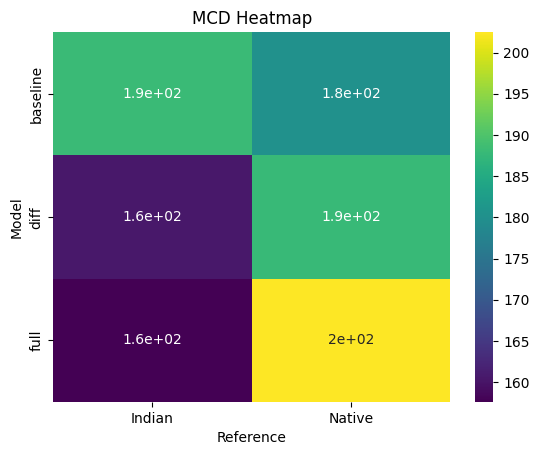

In [ ]:
audio_results = []

for name, path in MODELS.items():
    res_ind = evaluate_audio(path, GT_INDIAN)
    res_nat = evaluate_audio(path, GT_NATIVE)

    res_ind["Model"] = name
    res_ind["Reference"] = "Indian"
    res_nat["Model"] = name
    res_nat["Reference"] = "Native"

    audio_results.append(res_ind)
    audio_results.append(res_nat)

df_audio = pd.DataFrame(audio_results)
display(df_audio)

sns.heatmap(
    df_audio.pivot(index="Model", columns="Reference", values="MCD"),
    annot=True, cmap="viridis"
)
plt.title("MCD Heatmap")
plt.show()


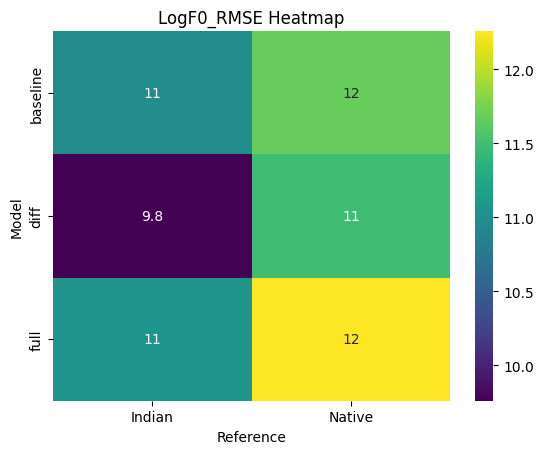

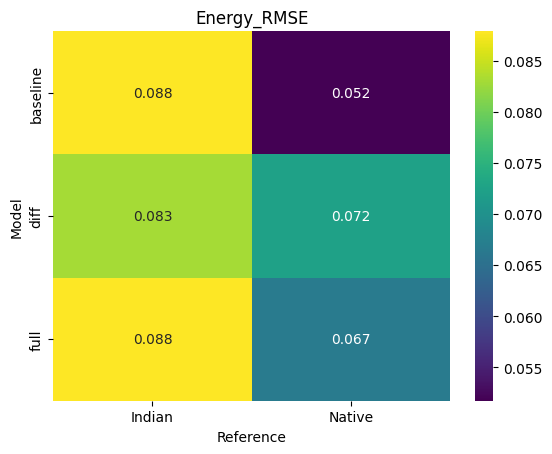

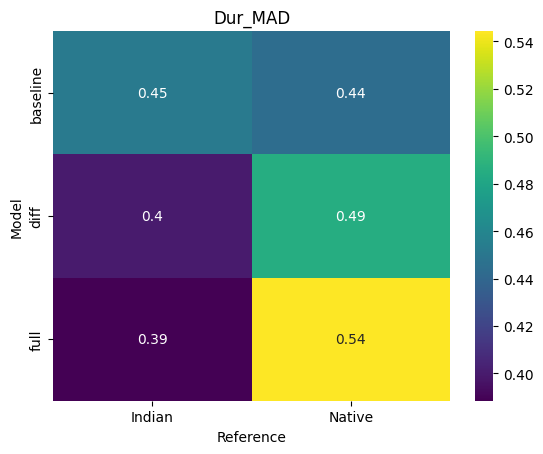

In [ ]:
sns.heatmap(
    df_audio.pivot(index="Model", columns="Reference", values="LogF0_RMSE"),
    annot=True, cmap="viridis"
)
plt.title("LogF0_RMSE Heatmap")
plt.show()

sns.heatmap(
    df_audio.pivot(index="Model", columns="Reference", values="Energy_RMSE"),
    annot=True, cmap="viridis"
)
plt.title("Energy_RMSE")
plt.show()

sns.heatmap(
    df_audio.pivot(index="Model", columns="Reference", values="Dur_MAD"),
    annot=True, cmap="viridis"
)
plt.title("Dur_MAD")
plt.show()

Style Vector analysis

In [ ]:
from sklearn.metrics import silhouette_score

In [ ]:
def load_styles(folder, key="s"):
    style_path = os.path.join(folder, "style_vectors")
    vectors = []

    if not os.path.exists(style_path):
        print(f"[WARNING] No style_vectors in {folder}")
        return None

    for f in sorted(os.listdir(style_path)):
        if f.endswith(f"_{key}.pt"):
            vec = torch.load(os.path.join(style_path, f), map_location="cpu")
            if isinstance(vec, torch.Tensor):
                vec = vec.numpy()
            vectors.append(vec)

    if len(vectors) == 0:
        return None

    return np.stack(vectors)


In [ ]:
style_data = {}

for name, path in MODELS.items():
    style_data[name] = {}
    for key in ["s", "sa", "sp"]:
        style_data[name][key] = load_styles(path, key)


In [ ]:
def centroid(v):
    return np.mean(v, axis=0)

def cosine_matrix(key="s"):

    models = list(style_data.keys())
    mat = np.zeros((len(models), len(models)))

    for i, m1 in enumerate(models):
        for j, m2 in enumerate(models):
            if style_data[m1][key] is None or style_data[m2][key] is None:
                mat[i, j] = np.nan
                continue

            c1 = centroid(style_data[m1][key])
            c2 = centroid(style_data[m2][key])
            mat[i, j] = cosine(c1, c2)

    df = pd.DataFrame(mat, index=models, columns=models)

    plt.figure(figsize=(6,5))
    sns.heatmap(df, annot=True, cmap="magma")
    plt.title(f"Centroid Cosine Distance ({key})")
    plt.show()

    return df


In [ ]:
def best_pca_dimension(key="s"):

    dims = [10, 20, 30, 50, 100]
    results = []

    all_vecs = []
    labels = []

    for m in style_data:
        if style_data[m][key] is None:
            continue
        all_vecs.append(style_data[m][key])
        labels += [m] * len(style_data[m][key])

    all_vecs = np.vstack(all_vecs)
    label_ids = pd.factorize(labels)[0]

    for d in dims:
        pca = PCA(n_components=d, random_state=42)
        reduced = pca.fit_transform(all_vecs)
        score = silhouette_score(reduced, label_ids)
        results.append((d, score))

    df = pd.DataFrame(results, columns=["PCA_dim", "Silhouette"])
    print(df)

    best_dim = df.loc[df["Silhouette"].idxmax(), "PCA_dim"]
    print("Best PCA dimension:", best_dim)

    return best_dim, df


In [ ]:
def pca_visualize(key="s", n_comp=50):

    all_vecs = []
    labels = []

    for m in style_data:
        if style_data[m][key] is None:
            continue
        all_vecs.append(style_data[m][key])
        labels += [m] * len(style_data[m][key])

    all_vecs = np.vstack(all_vecs)

    pca = PCA(n_components=n_comp, random_state=42)
    reduced = pca.fit_transform(all_vecs)

    pca2 = PCA(n_components=2, random_state=42)
    reduced2 = pca2.fit_transform(reduced)

    df = pd.DataFrame({
        "x": reduced2[:,0],
        "y": reduced2[:,1],
        "label": labels
    })

    plt.figure(figsize=(7,6))
    sns.scatterplot(data=df, x="x", y="y", hue="label")
    plt.title(f"PCA {n_comp}D → 2D ({key})")
    plt.show()


In [ ]:
def global_tsne_best(key="s", perplexity=40):

    best_dim, _ = best_pca_dimension(key)

    all_vecs = []
    labels = []

    for m in style_data:
        if style_data[m][key] is None:
            continue
        all_vecs.append(style_data[m][key])
        labels += [m] * len(style_data[m][key])

    all_vecs = np.vstack(all_vecs)

    pca = PCA(n_components=best_dim, random_state=42)
    pca_reduced = pca.fit_transform(all_vecs)

    tsne = TSNE(
        n_components=2,
        perplexity=perplexity,
        random_state=42,
        init="pca",
        learning_rate="auto"
    )

    reduced = tsne.fit_transform(pca_reduced)

    df = pd.DataFrame({
        "x": reduced[:,0],
        "y": reduced[:,1],
        "label": labels
    })

    plt.figure(figsize=(7,6))
    sns.scatterplot(data=df, x="x", y="y", hue="label")
    plt.title(f"Global t-SNE ({key}) using PCA-{best_dim}")
    plt.show()


In [ ]:
def pairwise_tsne(model1, model2, key="s", perplexity=30):

    v1 = style_data[model1][key]
    v2 = style_data[model2][key]

    combined = np.vstack([v1, v2])
    labels = [model1]*len(v1) + [model2]*len(v2)

    pca = PCA(n_components=50, random_state=42)
    reduced = pca.fit_transform(combined)

    tsne = TSNE(
        n_components=2,
        perplexity=perplexity,
        random_state=42,
        init="pca",
        learning_rate="auto"
    )

    final = tsne.fit_transform(reduced)

    df = pd.DataFrame({
        "x": final[:,0],
        "y": final[:,1],
        "label": labels
    })

    plt.figure(figsize=(6,5))
    sns.scatterplot(data=df, x="x", y="y", hue="label")
    plt.title(f"{model1} vs {model2} ({key})")
    plt.show()


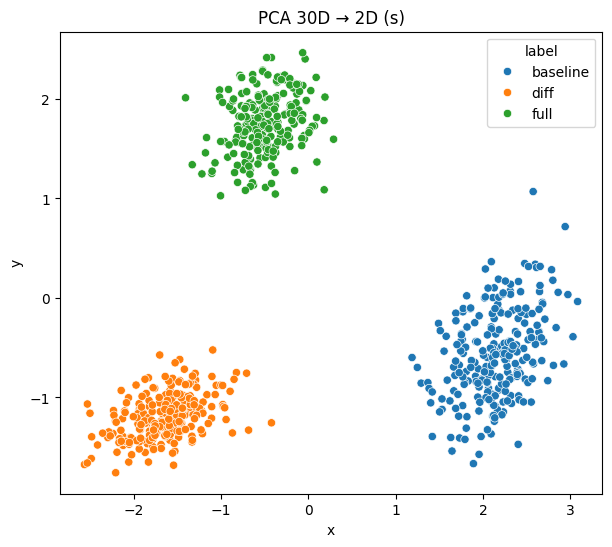

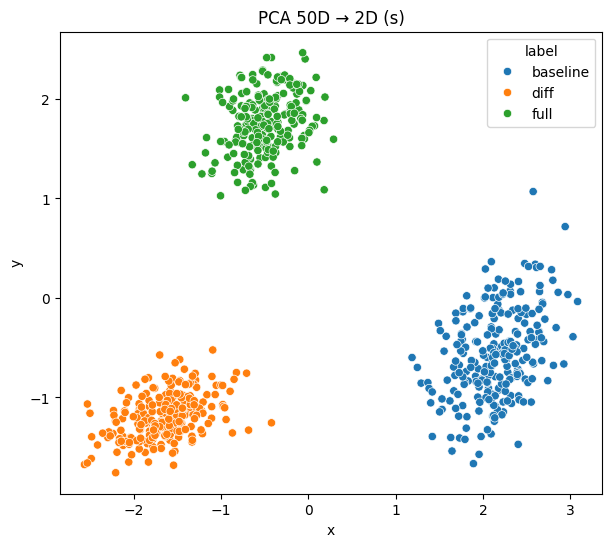

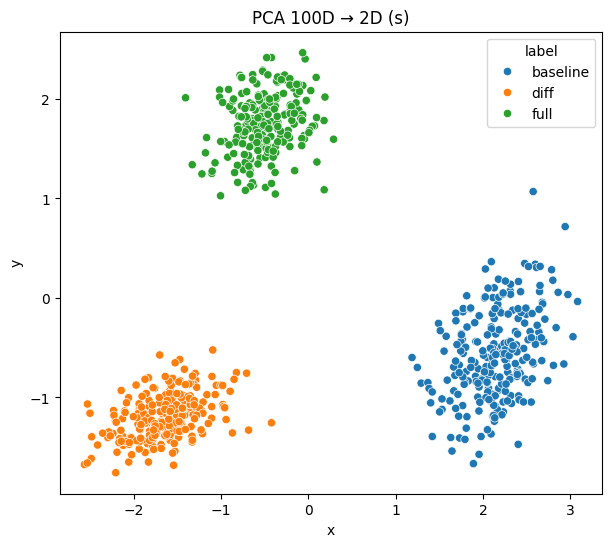

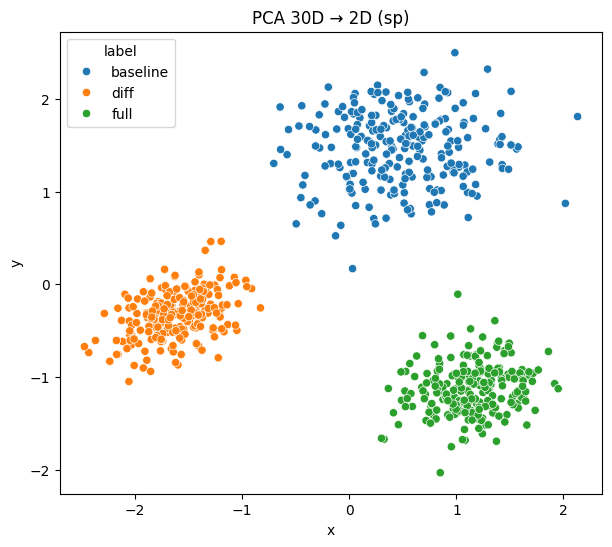

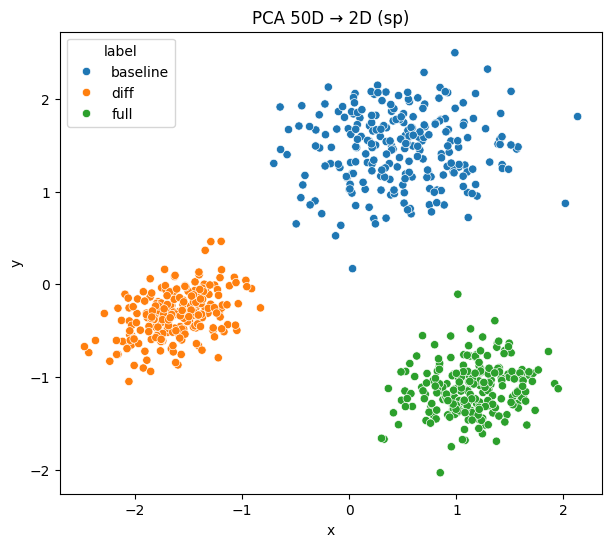

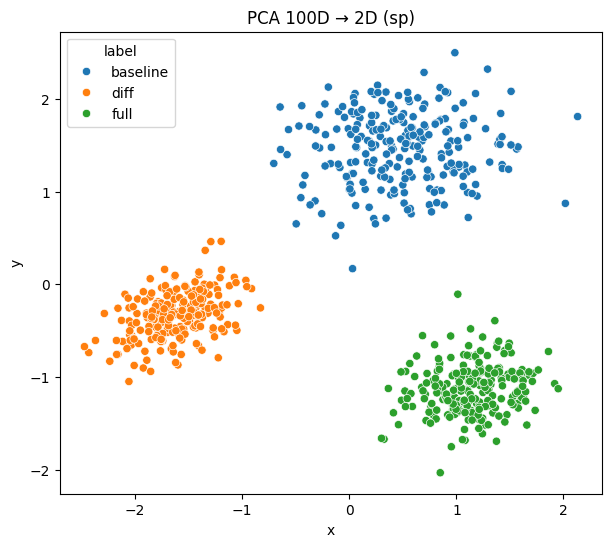

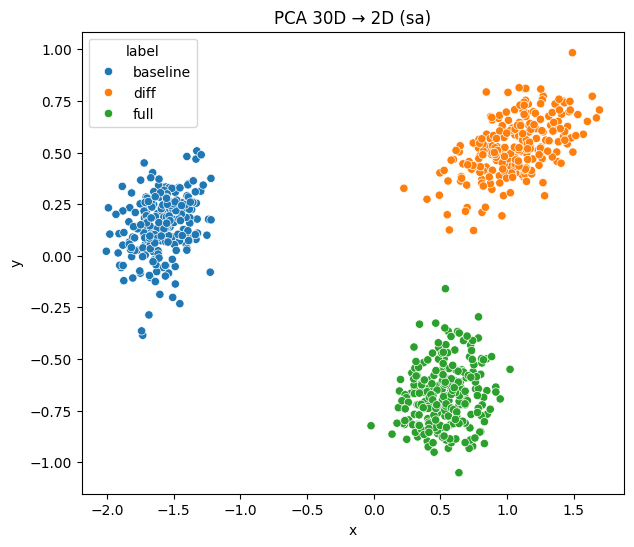

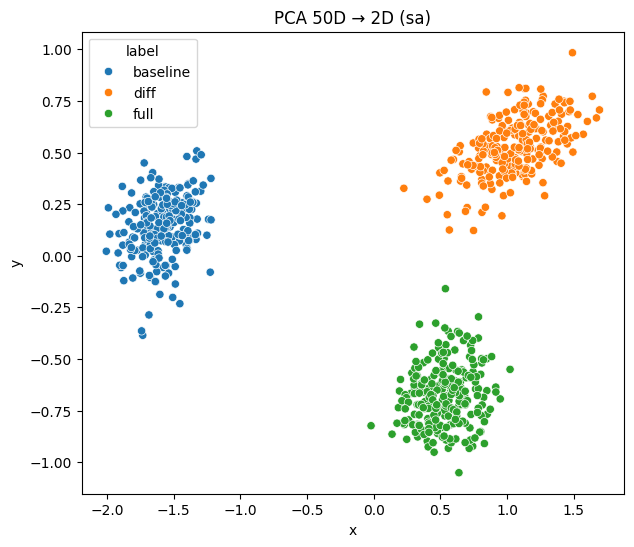

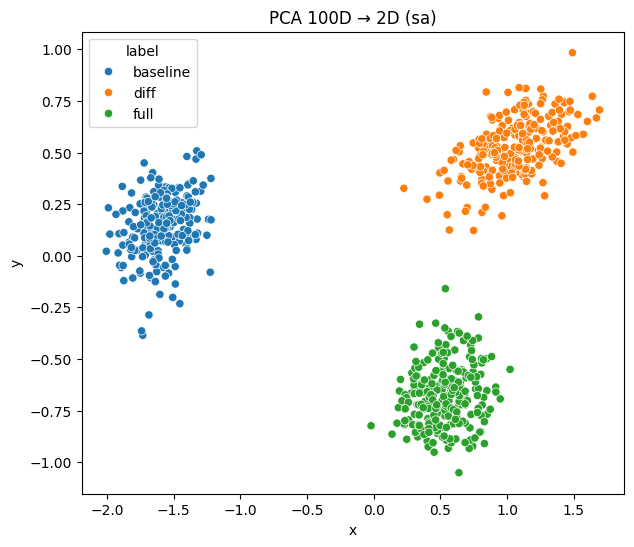

In [ ]:
# PCA projections
pca_visualize("s", 30)
pca_visualize("s", 50)
pca_visualize("s", 100)

pca_visualize("sp", 30)
pca_visualize("sp", 50)
pca_visualize("sp", 100)

pca_visualize("sa", 30)
pca_visualize("sa", 50)
pca_visualize("sa", 100)

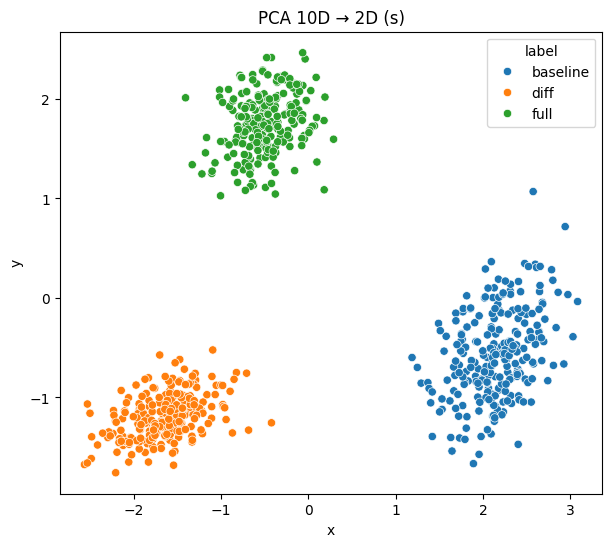

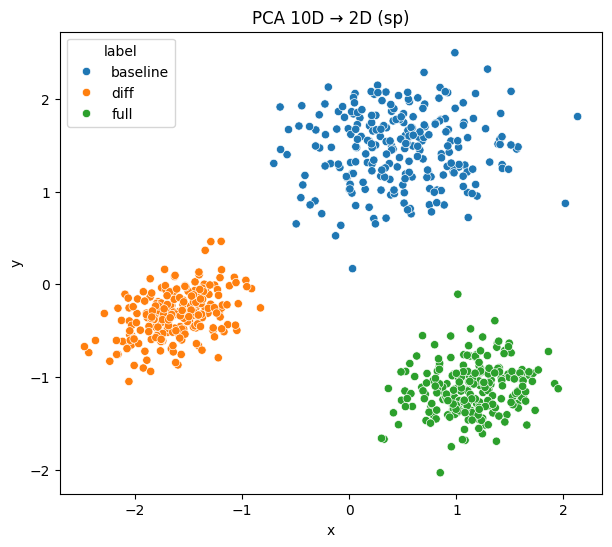

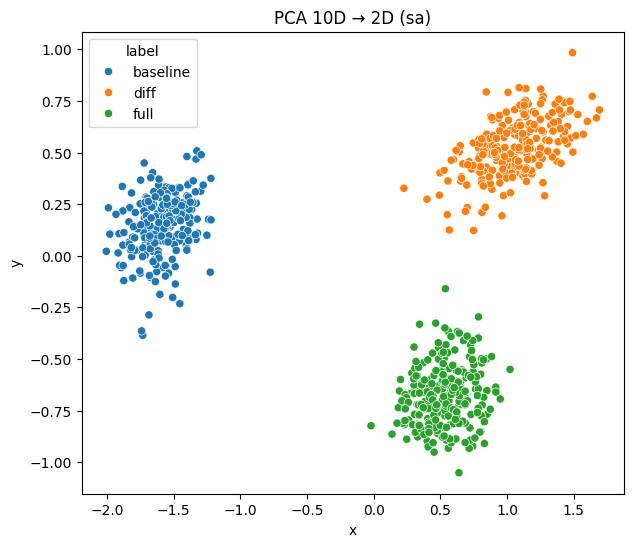

In [ ]:
pca_visualize("s", 10)
pca_visualize("sp", 10)
pca_visualize("sa", 10)

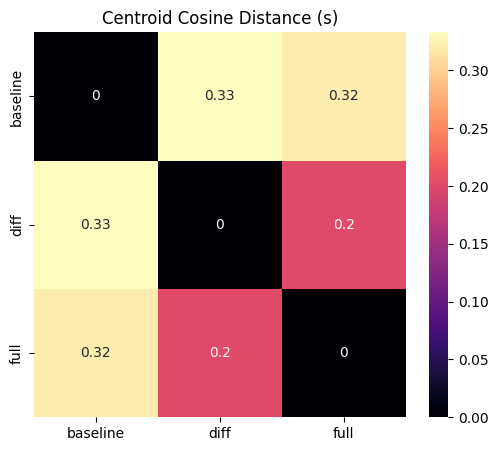

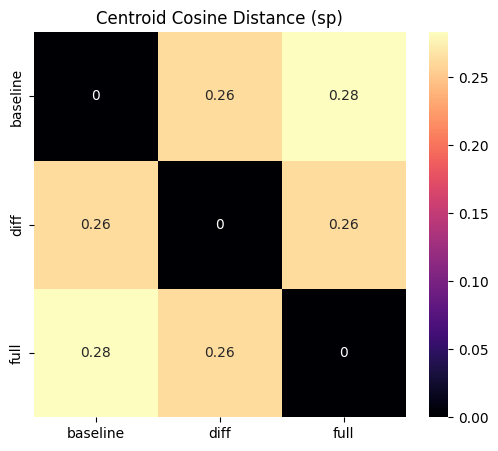

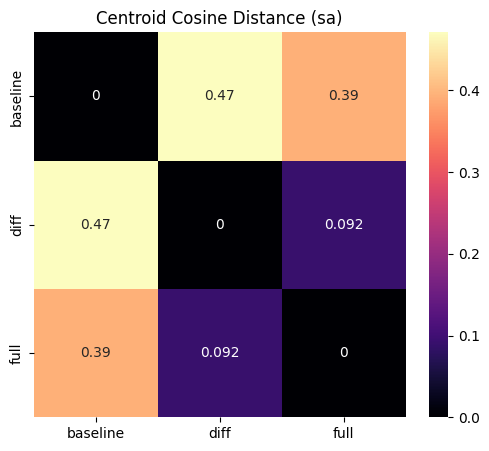

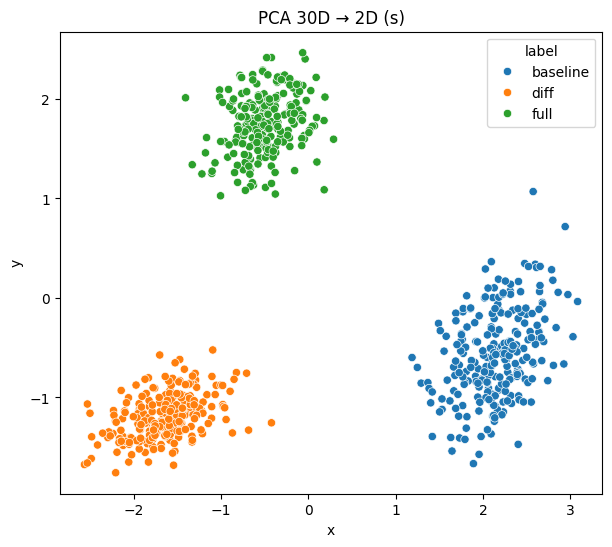

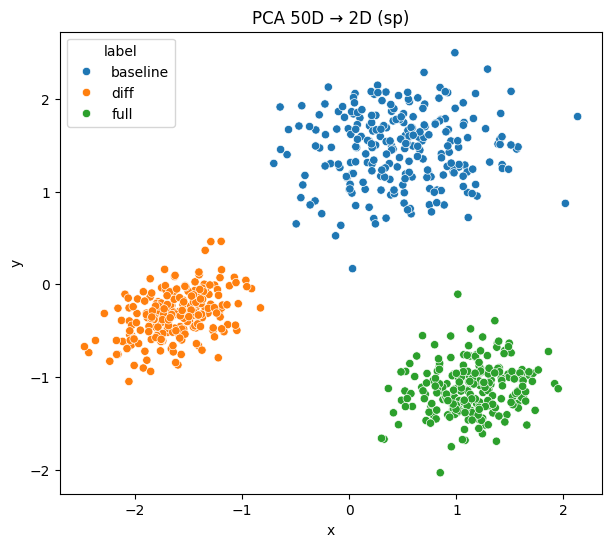

...

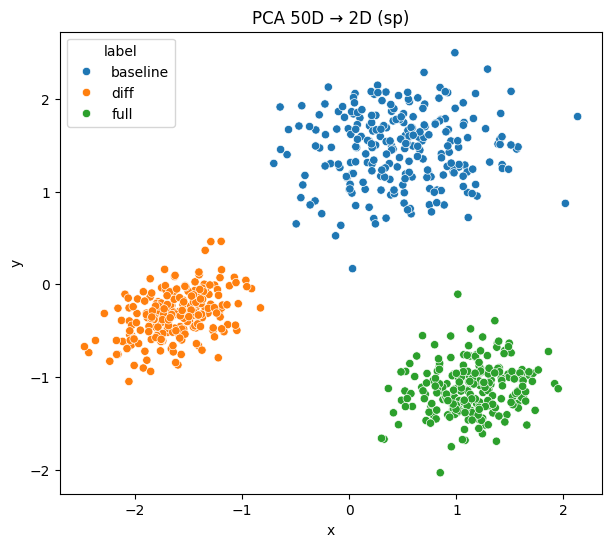

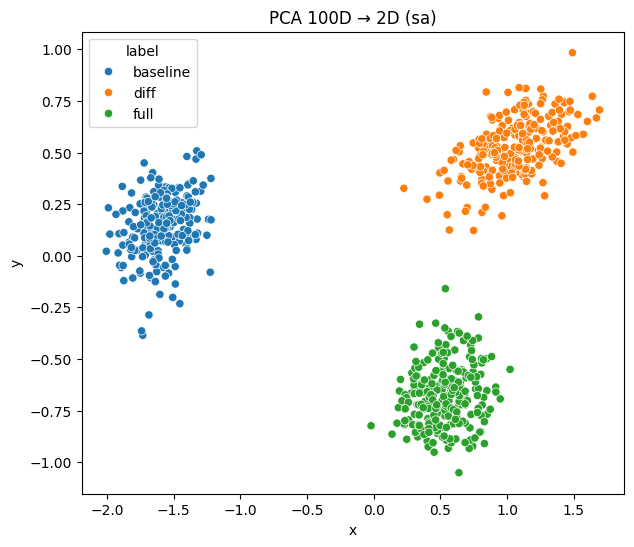

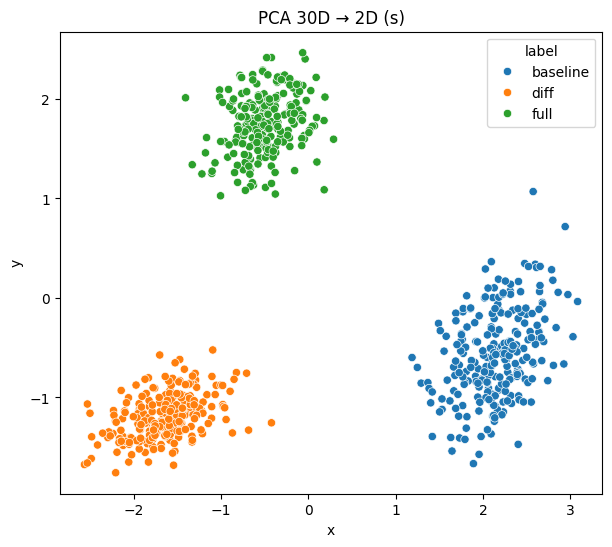

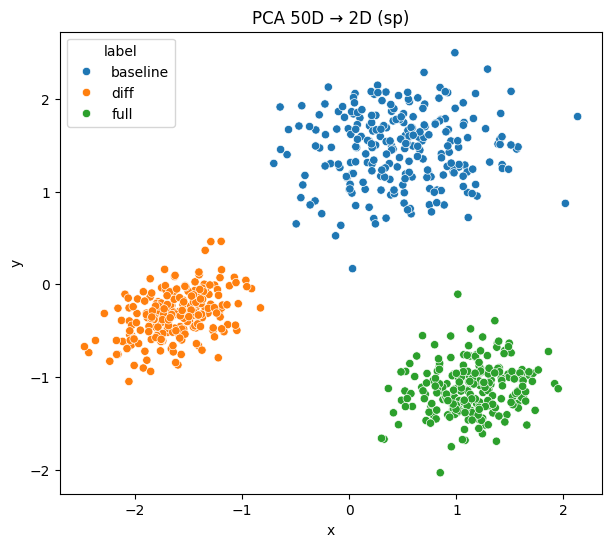

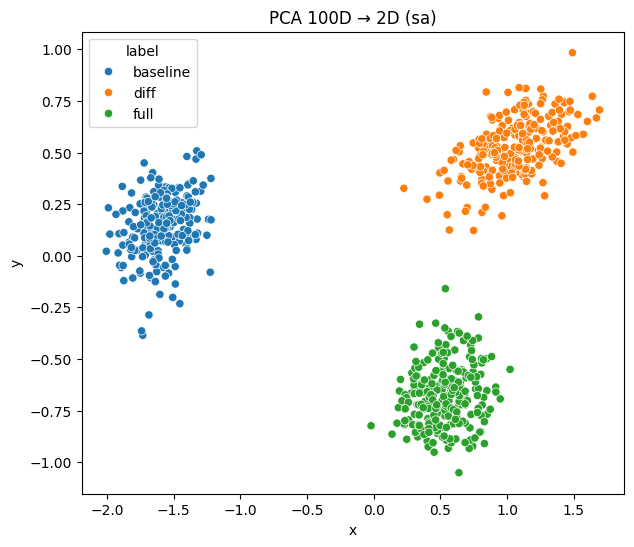

/tmp/ipython-input-1956378764.py:16: FutureWarning: factorize with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  label_ids = pd.factorize(labels)[0]


   PCA_dim  Silhouette
0       10    0.511585
1       20    0.416954
2       30    0.376165
3       50    0.344711
4      100    0.327078
Best PCA dimension: 10


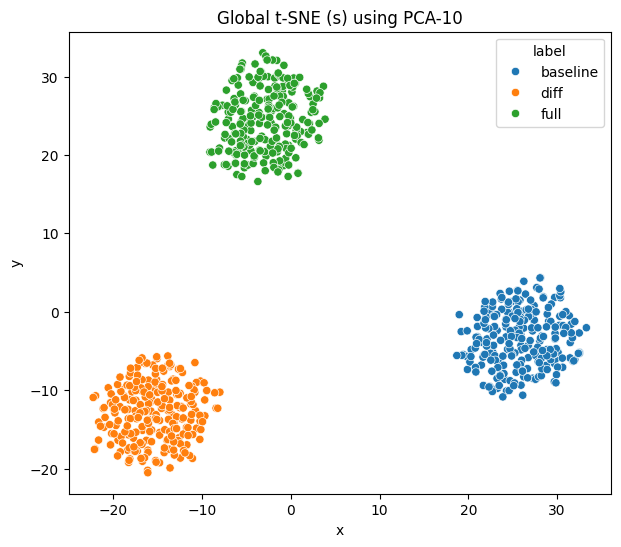

/tmp/ipython-input-1956378764.py:16: FutureWarning: factorize with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  label_ids = pd.factorize(labels)[0]


   PCA_dim  Silhouette
0       10    0.451656
1       20    0.359087
2       30    0.321917
3       50    0.296855
4      100    0.290245
Best PCA dimension: 10


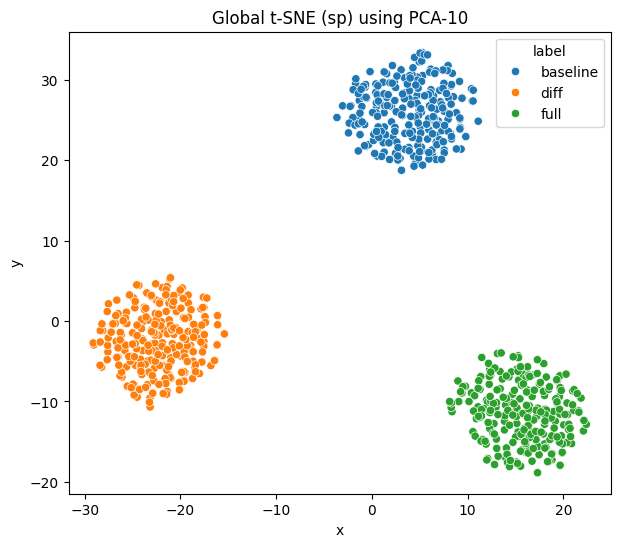

/tmp/ipython-input-1956378764.py:16: FutureWarning: factorize with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  label_ids = pd.factorize(labels)[0]


   PCA_dim  Silhouette
0       10    0.547478
1       20    0.468009
2       30    0.436333
3       50    0.410850
4      100    0.399928
Best PCA dimension: 10


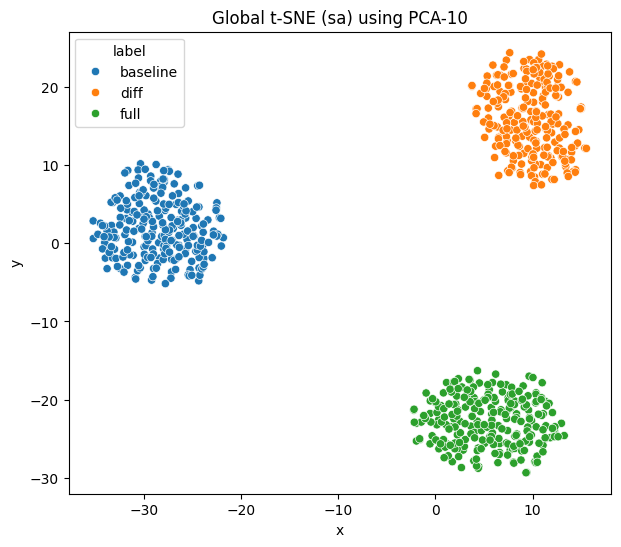

KeyError: 'baseline_lj'

In [ ]:
# Heatmaps
cosine_matrix("s")
cosine_matrix("sp")
cosine_matrix("sa")

# PCA projections
pca_visualize("s", 30)
pca_visualize("sp", 50)
pca_visualize("sa", 100)

# Global t-SNE
global_tsne_best("s")
global_tsne_best("sp")
global_tsne_best("sa")


In [ ]:
print(style_data.keys())


dict_keys(['baseline', 'diff', 'full'])


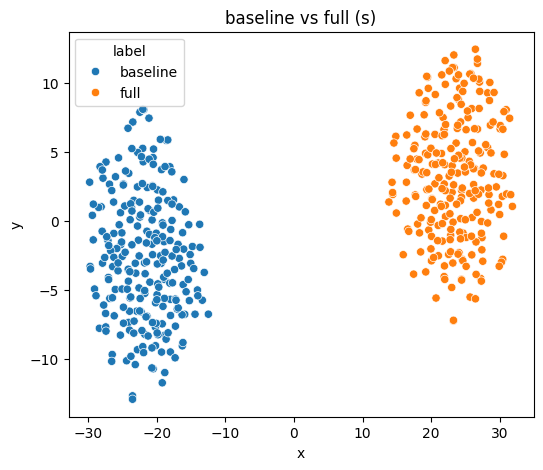

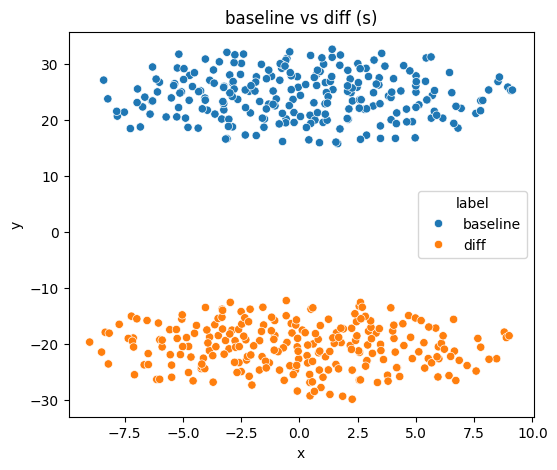

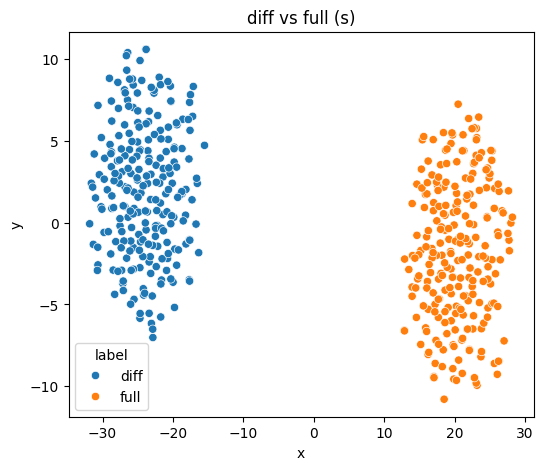

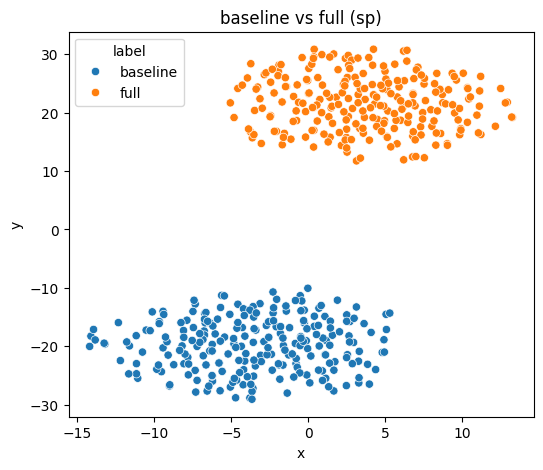

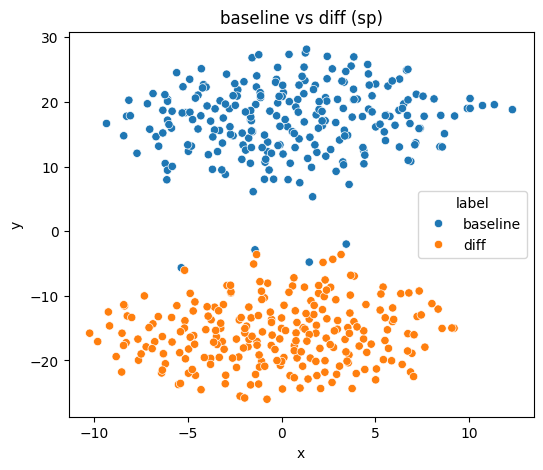

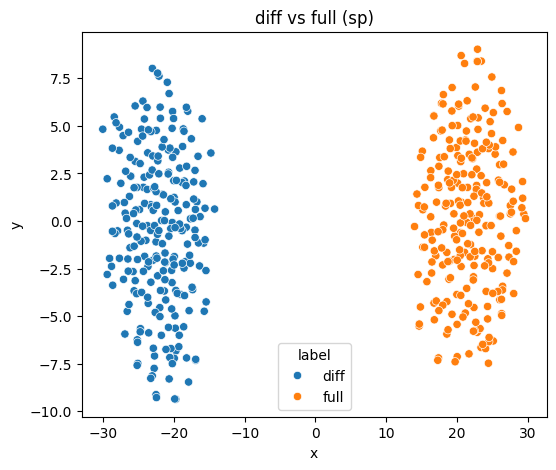

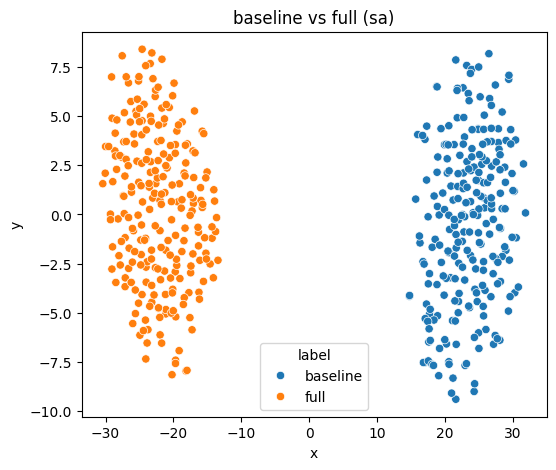

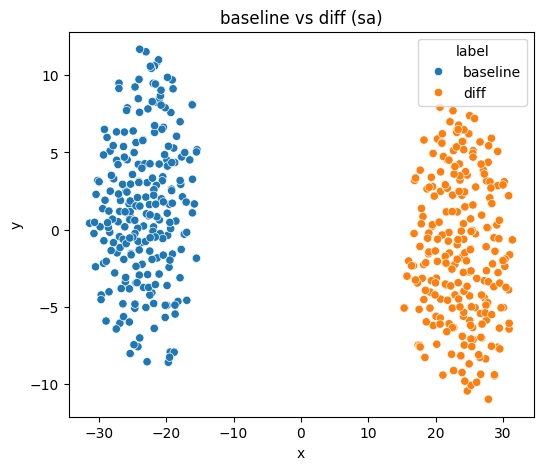

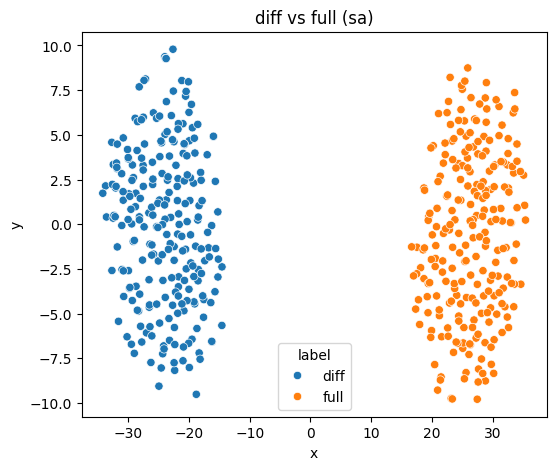

In [ ]:
# Pairwise
pairwise_tsne("baseline", "full", "s")
pairwise_tsne("baseline", "diff", "s")
pairwise_tsne("diff", "full", "s")

pairwise_tsne("baseline", "full", "sp")
pairwise_tsne("baseline", "diff", "sp")
pairwise_tsne("diff", "full", "sp")

pairwise_tsne("baseline", "full", "sa")
pairwise_tsne("baseline", "diff", "sa")
pairwise_tsne("diff", "full", "sa")

## Style Transfer


Models
```
baseline_lj (native model)
spicor_full_no_slm (Indian fine-tuned)
```

Ground truth



```
gt_native
gt_indian_matching
```



Style transfer

```
nat-ind (native model + Indian style)
ind-nat (Indian model + native style)
```





In [ ]:
import os
import numpy as np
import librosa
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
import re

In [ ]:
# =====================================================
# AUDIO FOLDERS
# =====================================================

folders = [
    "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/baseline_lj/audio_files",
    "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/spicor_full_no_slm/audio_files",
    "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/gt_native/audio_files",
    "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/gt_indian_matching/audio_files",
    "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/ind-nat/audio_files",
    "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/nat-ind/audio_files",
]

print("\n================ AUDIO FILE VERIFICATION ================\n")

for folder in folders:
    print("Folder:", folder)

    if not os.path.exists(folder):
        print("  [ERROR] Path does not exist.\n")
        continue

    wav_files = [f for f in os.listdir(folder) if f.endswith(".wav")]
    print("  Number of .wav files:", len(wav_files))
    print("-" * 60)


================ AUDIO FILE VERIFICATION ================

Folder: /content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/baseline_lj/audio_files
  Number of .wav files: 238
------------------------------------------------------------
Folder: /content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/spicor_full_no_slm/audio_files
  Number of .wav files: 238
------------------------------------------------------------
Folder: /content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/gt_native/audio_files
  Number of .wav files: 238
------------------------------------------------------------
Folder: /content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/gt_indian_matching/audio_files
  Number of .wav files: 238
------------------------------------------------------------
Folder: /content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/ind-nat/audio_files
  Number of .wav files: 714
-----------------------

In [ ]:
# =====================================================
# STYLE VECTOR VERIFICATION (baseline & spicor only)
# =====================================================

print("\n================ STYLE VECTOR VERIFICATION ================\n")

model_roots = [
    "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/baseline_lj",
    "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/spicor_full_no_slm",
]

for root in model_roots:
    style_path = os.path.join(root, "style_vectors")

    print("Model Root:", root)

    if not os.path.exists(style_path):
        print("  [WARNING] No style_vectors folder found.\n")
        continue

    files = os.listdir(style_path)

    s_files = [f for f in files if f.endswith("_s.pt")]
    sa_files = [f for f in files if f.endswith("_sa.pt")]
    sp_files = [f for f in files if f.endswith("_sp.pt")]

    print("  style_vectors folder exists.")
    print("  _s.pt files :", len(s_files))
    print("  _sa.pt files:", len(sa_files))
    print("  _sp.pt files:", len(sp_files))
    print("-" * 60)


================ STYLE VECTOR VERIFICATION ================

Model Root: /content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/baseline_lj
  style_vectors folder exists.
  _s.pt files : 238
  _sa.pt files: 238
  _sp.pt files: 238
------------------------------------------------------------
Model Root: /content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/spicor_full_no_slm
  style_vectors folder exists.
  _s.pt files : 238
  _sa.pt files: 238
  _sp.pt files: 238
------------------------------------------------------------


Creating master dict

In [ ]:
# --------------------------------------------------
# DEFINE ROOT PATHS
# --------------------------------------------------

folder_map = {
    "baseline": "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/baseline_lj/audio_files",
    "spicor": "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/spicor_full_no_slm/audio_files",
    "gt_native": "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/gt_native/audio_files",
    "gt_indian": "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/gt_indian_matching/audio_files",
    "ind-nat": "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/ind-nat/audio_files",
    "nat-ind": "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/nat-ind/audio_files",
}

# --------------------------------------------------
# HELPER: Extract LJxxx-xxxx ID
# --------------------------------------------------

def extract_lj_id(filename):
    match = re.search(r"(LJ\d{3}-\d{4})", filename)
    return match.group(1) if match else None


# --------------------------------------------------
# BUILD MASTER DICTIONARY
# --------------------------------------------------

master_dict = {}

for label, folder in folder_map.items():
    files = os.listdir(folder)

    for f in files:
        if not f.endswith(".wav"):
            continue

        lj_id = extract_lj_id(f)
        if lj_id is None:
            continue

        if lj_id not in master_dict:
            master_dict[lj_id] = {}

        full_path = os.path.join(folder, f)

        # Handle transfer variants separately
        if label in ["nat-ind", "ind-nat"]:
            variant = f.replace(lj_id, "").replace(".wav", "")
            key_name = f"{label}{variant}"
            master_dict[lj_id][key_name] = full_path
        else:
            master_dict[lj_id][label] = full_path


# --------------------------------------------------
# VALIDATION PRINT
# --------------------------------------------------

print("Total aligned LJ IDs:", len(master_dict))

sample_id = sorted(master_dict.keys())[0]
print("\nSample entry for:", sample_id)
for k, v in master_dict[sample_id].items():
    print(" ", k, "→", v)

Total aligned LJ IDs: 238

Sample entry for: LJ001-0006
  baseline → /content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/baseline_lj/audio_files/LJ001-0006.wav
  spicor → /content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/spicor_full_no_slm/audio_files/LJ001-0006.wav
  gt_native → /content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/gt_native/audio_files/LJ001-0006.wav
  gt_indian → /content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/gt_indian_matching/audio_files/LJ001-0006.wav
  ind-nat_s → /content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/ind-nat/audio_files/LJ001-0006_s.wav
  ind-nat_sp → /content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/ind-nat/audio_files/LJ001-0006_sp.wav
  ind-nat_sa → /content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/ind-nat/audio_files/LJ001-0006_sa.wav
  nat-ind_s → /content/drive/MyDrive/Namrata-IMP-Docs/II

In [ ]:
SR = 24000

MCD

In [ ]:
N_MFCC = 13

In [ ]:
!pip install fastdtw

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 14.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for fastdtw: filename=fastdtw-0.3.4-cp312-cp312-linux_x86_64.whl size=567860 sha256=4a443fccb1f3922102c30f0436705ad5320f5552d4874de2acb3f865b807ce8c
  Stored in directory: /root/.cache/pip/wheels/ab/d0/26/b82cb0f49ae73e5e6bba4e8462fff2c9851d7bd2ec64f8891e
Successfully built fastdtw


In [ ]:
import librosa
import numpy as np
from scipy.spatial.distance import cdist
from fastdtw import fastdtw

SR = 24000
N_MELS = 80
N_MFCC = 13
ALPHA = (10 * np.sqrt(2)) / np.log(10)  # ≈ 23.6

# -------------------------------------------------
# AUDIO + MCD
# -------------------------------------------------

def load_audio(path):
    wav, _ = librosa.load(path, sr=SR)
    return wav

def compute_mfcc(wav):
    # Step 1: mel spectrogram (power)
    mel = librosa.feature.melspectrogram(y=wav, sr=SR, n_mels=N_MELS, fmin=0, fmax=SR/2)
    # Step 2: log mel (log10)
    log_mel = np.log10(np.maximum(mel, 1e-10))
    # Step 3: DCT to get MFCCs, skip coefficient 0 (energy), keep 1..N_MFCC
    mfcc = librosa.feature.mfcc(S=log_mel, n_mfcc=N_MFCC + 1)[1:]  # shape: (N_MFCC, T)
    return mfcc

def compute_mcd(m1, m2):
    # DTW alignment
    dist, path = fastdtw(m1.T, m2.T, dist=lambda a, b: np.linalg.norm(a - b))
    # Compute MCD along the warped path with correct alpha scaling
    frames = np.array([(m1[:, i] - m2[:, j]) for i, j in path])
    per_frame = ALPHA * np.sqrt(np.sum(frames**2, axis=1))
    return np.mean(per_frame)

In [ ]:
# -------------------------------------------------
# FUNCTION TO COMPUTE TABLE FOR A GIVEN VARIANT
# -------------------------------------------------

def compute_mcd_table(variant_suffix):

    """
    variant_suffix:
        ""     → baseline/spicor
        "_s"
        "_sa"
        "_sp"
    """

    comparison_pairs = [
        ("baseline", "gt_native"),
        ("baseline", "gt_indian"),
        ("spicor", "gt_native"),
        ("spicor", "gt_indian"),
        (f"nat-ind{variant_suffix}", "gt_indian"),
        (f"ind-nat{variant_suffix}", "gt_native"),
    ]

    results = []

    for model_label, ref_label in comparison_pairs:

        mcd_scores = []

        print(f"Computing MCD: {model_label} vs {ref_label}")

        for lj_id in tqdm(master_dict.keys(), leave=False):

            if model_label not in master_dict[lj_id]:
                continue
            if ref_label not in master_dict[lj_id]:
                continue

            pred_path = master_dict[lj_id][model_label]
            ref_path = master_dict[lj_id][ref_label]

            wav_pred = load_audio(pred_path)
            wav_ref = load_audio(ref_path)

            mfcc_pred = compute_mfcc(wav_pred)
            mfcc_ref = compute_mfcc(wav_ref)

            mcd_val = compute_mcd(mfcc_pred, mfcc_ref)
            mcd_scores.append(mcd_val)

        results.append({
            "Model": model_label,
            "Reference": ref_label,
            "MCD": np.mean(mcd_scores)
        })

    df = pd.DataFrame(results)

    pivot = df.pivot(index="Model", columns="Reference", values="MCD")

    return pivot

In [ ]:
# -------------------------------------------------
# COMPUTE TABLES
# -------------------------------------------------

print("\n=== Computing MCD Tables ===\n")

mcd_s   = compute_mcd_table("_s")
mcd_sa  = compute_mcd_table("_sa")
mcd_sp  = compute_mcd_table("_sp")


=== Computing MCD Tables ===

Computing MCD: baseline vs gt_native


Computing MCD: baseline vs gt_indian


Computing MCD: spicor vs gt_native


Computing MCD: spicor vs gt_indian


Computing MCD: nat-ind_s vs gt_indian


Computing MCD: ind-nat_s vs gt_native


Computing MCD: baseline vs gt_native


Computing MCD: baseline vs gt_indian


Computing MCD: spicor vs gt_native


Computing MCD: spicor vs gt_indian


Computing MCD: nat-ind_sa vs gt_indian


Computing MCD: ind-nat_sa vs gt_native


Computing MCD: baseline vs gt_native


Computing MCD: baseline vs gt_indian


Computing MCD: spicor vs gt_native


Computing MCD: spicor vs gt_indian


Computing MCD: nat-ind_sp vs gt_indian


Computing MCD: ind-nat_sp vs gt_native


In [ ]:
# -------------------------------------------------
# GLOBAL COLOR SCALE (IMPORTANT)
# -------------------------------------------------

global_min = min(mcd_s.min().min(),
                 mcd_sa.min().min(),
                 mcd_sp.min().min())

global_max = max(mcd_s.max().max(),
                 mcd_sa.max().max(),
                 mcd_sp.max().max())


# -------------------------------------------------
# PLOT HEATMAPS
# -------------------------------------------------

def plot_heatmap(table, title):

    plt.figure(figsize=(6,5))
    sns.heatmap(
        table,
        annot=True,
        fmt=".3f",
        cmap="Reds_r",
        vmin=global_min,
        vmax=global_max
    )
    plt.title(title)
    plt.ylabel("")
    plt.xlabel("")
    plt.show()

====================Proper_MCD_Maps_23rd_feb_night_final======================


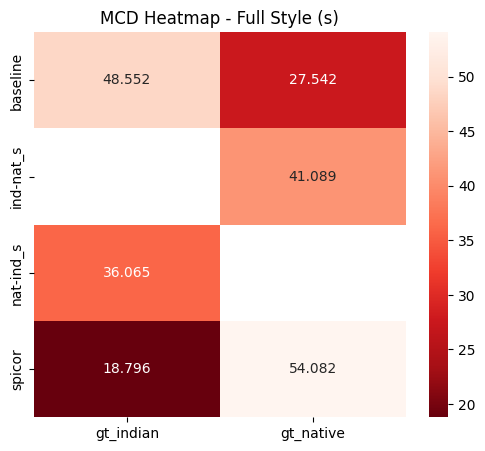

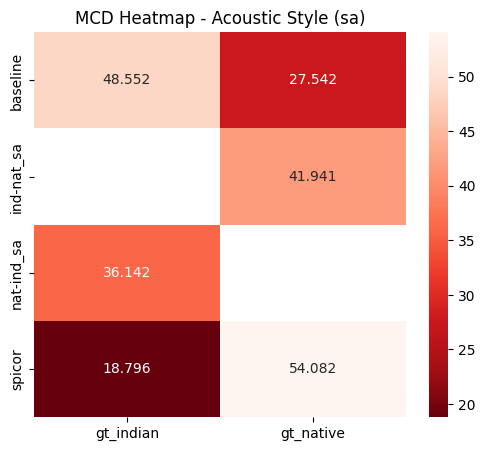

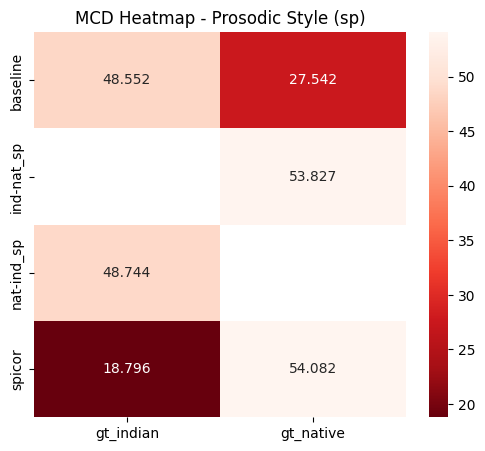


=== Tables ===

Full Style (s):


Reference,gt_indian,gt_native
Model,,
baseline,48.551647,27.541590
ind-nat_s,NaN,41.088599
nat-ind_s,36.064588,NaN
spicor,18.795715,54.082110


Acoustic Style (sa):


Reference,gt_indian,gt_native
Model,,
baseline,48.551647,27.541590
ind-nat_sa,NaN,41.941313
nat-ind_sa,36.142405,NaN
spicor,18.795715,54.082110


Prosodic Style (sp):


Reference,gt_indian,gt_native
Model,,
baseline,48.551647,27.541590
ind-nat_sp,NaN,53.826652
nat-ind_sp,48.744097,NaN
spicor,18.795715,54.082110


In [ ]:
print("====================Proper_MCD_Maps_23rd_feb_night_final======================")

plot_heatmap(mcd_s,  "MCD Heatmap - Full Style (s)")
plot_heatmap(mcd_sa, "MCD Heatmap - Acoustic Style (sa)")
plot_heatmap(mcd_sp, "MCD Heatmap - Prosodic Style (sp)")


print("\n=== Tables ===\n")
print("Full Style (s):")
display(mcd_s)

print("Acoustic Style (sa):")
display(mcd_sa)

print("Prosodic Style (sp):")
display(mcd_sp)

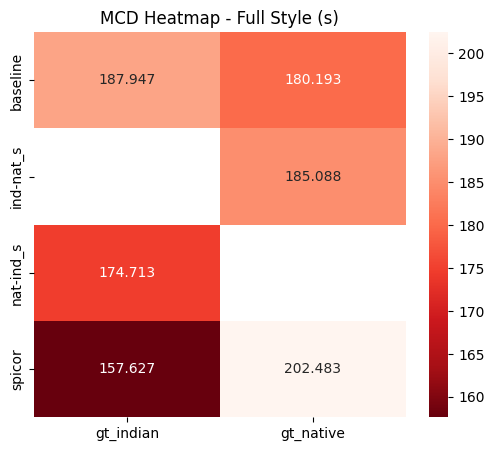

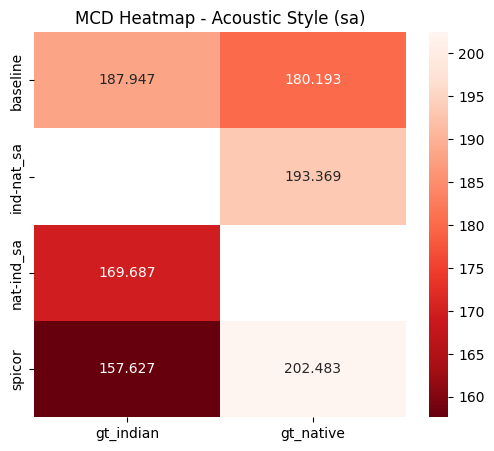

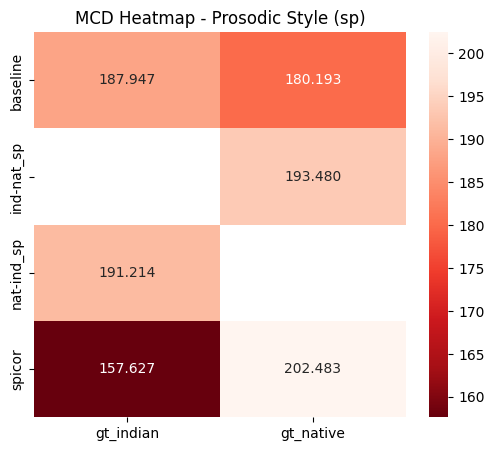


=== Tables ===

Full Style (s):


Reference,gt_indian,gt_native
Model,,
baseline,187.946960,180.193146
ind-nat_s,NaN,185.088470
nat-ind_s,174.713379,NaN
spicor,157.626602,202.483292


Acoustic Style (sa):


Reference,gt_indian,gt_native
Model,,
baseline,187.946960,180.193146
ind-nat_sa,NaN,193.369324
nat-ind_sa,169.687042,NaN
spicor,157.626602,202.483292


Prosodic Style (sp):


Reference,gt_indian,gt_native
Model,,
baseline,187.946960,180.193146
ind-nat_sp,NaN,193.479752
nat-ind_sp,191.213608,NaN
spicor,157.626602,202.483292


In [ ]:
plot_heatmap(mcd_s,  "MCD Heatmap - Full Style (s)")
plot_heatmap(mcd_sa, "MCD Heatmap - Acoustic Style (sa)")
plot_heatmap(mcd_sp, "MCD Heatmap - Prosodic Style (sp)")


print("\n=== Tables ===\n")
print("Full Style (s):")
display(mcd_s)

print("Acoustic Style (sa):")
display(mcd_sa)

print("Prosodic Style (sp):")
display(mcd_sp)

Log F0 RMSE

In [ ]:
# -------------------------------------------------
# LOG F0 EXTRACTION
# -------------------------------------------------

def load_audio(path):
    wav, _ = librosa.load(path, sr=SR)
    return wav

def compute_log_f0(wav):
    f0, _, _ = librosa.pyin(
        wav,
        fmin=50,
        fmax=500,
        sr=SR
    )
    f0 = np.nan_to_num(f0)
    return np.log(f0 + 1e-6)

def compute_rmse(x, y):
    min_len = min(len(x), len(y))
    return np.sqrt(np.mean((x[:min_len] - y[:min_len])**2))

In [ ]:
# -------------------------------------------------
# FUNCTION TO COMPUTE TABLE FOR VARIANT
# -------------------------------------------------

def compute_logf0_table(variant_suffix):

    comparison_pairs = [
        ("baseline", "gt_native"),
        ("baseline", "gt_indian"),
        ("spicor", "gt_native"),
        ("spicor", "gt_indian"),
        (f"nat-ind{variant_suffix}", "gt_indian"),
        (f"ind-nat{variant_suffix}", "gt_native"),
    ]

    results = []

    for model_label, ref_label in comparison_pairs:

        scores = []

        print(f"Computing LogF0 RMSE: {model_label} vs {ref_label}")

        for lj_id in tqdm(master_dict.keys(), leave=False):

            if model_label not in master_dict[lj_id]:
                continue
            if ref_label not in master_dict[lj_id]:
                continue

            pred_path = master_dict[lj_id][model_label]
            ref_path = master_dict[lj_id][ref_label]

            wav_pred = load_audio(pred_path)
            wav_ref = load_audio(ref_path)

            logf0_pred = compute_log_f0(wav_pred)
            logf0_ref = compute_log_f0(wav_ref)

            rmse_val = compute_rmse(logf0_pred, logf0_ref)
            scores.append(rmse_val)

        results.append({
            "Model": model_label,
            "Reference": ref_label,
            "LogF0_RMSE": np.mean(scores)
        })

    df = pd.DataFrame(results)
    pivot = df.pivot(index="Model", columns="Reference", values="LogF0_RMSE")
    return pivot

In [ ]:
# -------------------------------------------------
# COMPUTE TABLES
# -------------------------------------------------

print("\n=== Computing Log F0 RMSE Tables ===\n")

logf0_s   = compute_logf0_table("_s")
logf0_sa  = compute_logf0_table("_sa")
logf0_sp  = compute_logf0_table("_sp")


=== Computing Log F0 RMSE Tables ===

Computing LogF0 RMSE: baseline vs gt_native


Computing LogF0 RMSE: baseline vs gt_indian


Computing LogF0 RMSE: spicor vs gt_native


Computing LogF0 RMSE: spicor vs gt_indian


Computing LogF0 RMSE: nat-ind_s vs gt_indian


Computing LogF0 RMSE: ind-nat_s vs gt_native


Computing LogF0 RMSE: baseline vs gt_native


Computing LogF0 RMSE: baseline vs gt_indian


Computing LogF0 RMSE: spicor vs gt_native


Computing LogF0 RMSE: spicor vs gt_indian


Computing LogF0 RMSE: nat-ind_sa vs gt_indian


Computing LogF0 RMSE: ind-nat_sa vs gt_native


Computing LogF0 RMSE: baseline vs gt_native


Computing LogF0 RMSE: baseline vs gt_indian


Computing LogF0 RMSE: spicor vs gt_native


Computing LogF0 RMSE: spicor vs gt_indian


Computing LogF0 RMSE: nat-ind_sp vs gt_indian


Computing LogF0 RMSE: ind-nat_sp vs gt_native


In [ ]:
# -------------------------------------------------
# GLOBAL COLOR SCALE (shared across all 3)
# -------------------------------------------------

global_min = min(logf0_s.min().min(),
                 logf0_sa.min().min(),
                 logf0_sp.min().min())

global_max = max(logf0_s.max().max(),
                 logf0_sa.max().max(),
                 logf0_sp.max().max())


# -------------------------------------------------
# HEATMAP PLOT FUNCTION
# -------------------------------------------------

def plot_heatmap(table, title):
    plt.figure(figsize=(6,5))
    sns.heatmap(
        table,
        annot=True,
        fmt=".4f",
        cmap="Reds_r",      # reversed so darker = lower (better)
        vmin=global_min,
        vmax=global_max
    )
    plt.title(title)
    plt.ylabel("")
    plt.xlabel("")
    plt.show()

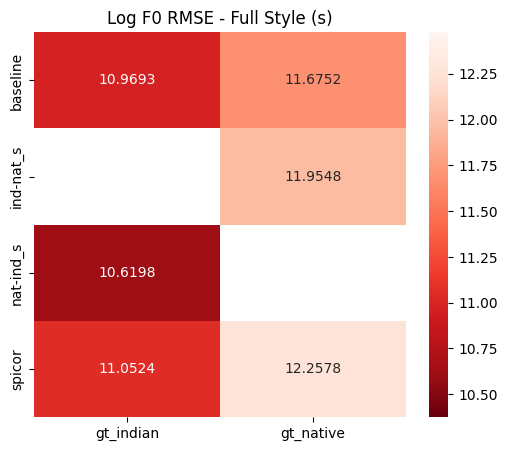

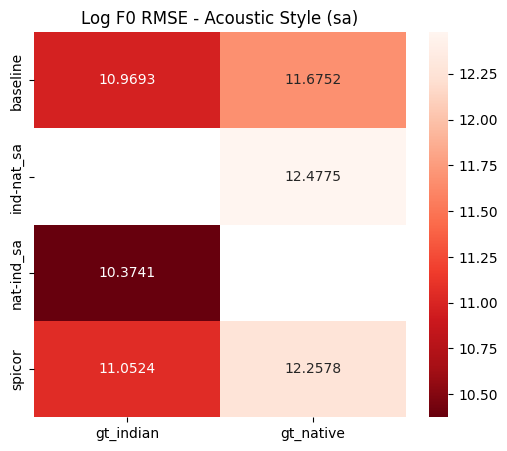

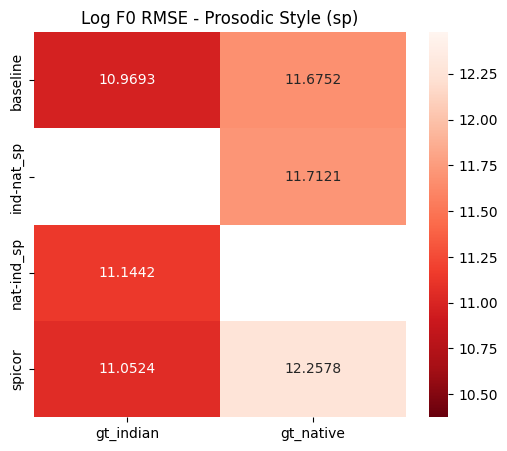


=== Tables ===

Full Style (s):


Reference,gt_indian,gt_native
Model,,
baseline,10.969300,11.675208
ind-nat_s,NaN,11.954803
nat-ind_s,10.619805,NaN
spicor,11.052385,12.257774


Acoustic Style (sa):


Reference,gt_indian,gt_native
Model,,
baseline,10.969300,11.675208
ind-nat_sa,NaN,12.477490
nat-ind_sa,10.374140,NaN
spicor,11.052385,12.257774


Prosodic Style (sp):


Reference,gt_indian,gt_native
Model,,
baseline,10.969300,11.675208
ind-nat_sp,NaN,11.712131
nat-ind_sp,11.144233,NaN
spicor,11.052385,12.257774


In [ ]:
plot_heatmap(logf0_s,  "Log F0 RMSE - Full Style (s)")
plot_heatmap(logf0_sa, "Log F0 RMSE - Acoustic Style (sa)")
plot_heatmap(logf0_sp, "Log F0 RMSE - Prosodic Style (sp)")


print("\n=== Tables ===\n")

print("Full Style (s):")
display(logf0_s)

print("Acoustic Style (sa):")
display(logf0_sa)

print("Prosodic Style (sp):")
display(logf0_sp)

DUR MAD - Mean Absolute Deviation

In [ ]:
# -------------------------------------------------
# ENERGY EXTRACTION
# -------------------------------------------------

def load_audio(path):
    wav, _ = librosa.load(path, sr=SR)
    return wav

def compute_energy(wav):
    return librosa.feature.rms(y=wav)[0]

def compute_mad(x, y):
    min_len = min(len(x), len(y))
    return np.mean(np.abs(x[:min_len] - y[:min_len]))

In [ ]:
# -------------------------------------------------
# TABLE COMPUTATION FUNCTION
# -------------------------------------------------

def compute_durmad_table(variant_suffix):

    comparison_pairs = [
        ("baseline", "gt_native"),
        ("baseline", "gt_indian"),
        ("spicor", "gt_native"),
        ("spicor", "gt_indian"),
        (f"nat-ind{variant_suffix}", "gt_indian"),
        (f"ind-nat{variant_suffix}", "gt_native"),
    ]

    results = []

    for model_label, ref_label in comparison_pairs:

        scores = []

        print(f"Computing Duration MAD: {model_label} vs {ref_label}")

        for lj_id in tqdm(master_dict.keys(), leave=False):

            if model_label not in master_dict[lj_id]:
                continue
            if ref_label not in master_dict[lj_id]:
                continue

            pred_path = master_dict[lj_id][model_label]
            ref_path = master_dict[lj_id][ref_label]

            wav_pred = load_audio(pred_path)
            wav_ref = load_audio(ref_path)

            energy_pred = compute_energy(wav_pred)
            energy_ref = compute_energy(wav_ref)

            mad_val = compute_mad(energy_pred, energy_ref)
            scores.append(mad_val)

        results.append({
            "Model": model_label,
            "Reference": ref_label,
            "Dur_MAD": np.mean(scores)
        })

    df = pd.DataFrame(results)
    pivot = df.pivot(index="Model", columns="Reference", values="Dur_MAD")
    return pivot


# -------------------------------------------------
# COMPUTE TABLES
# -------------------------------------------------

print("\n=== Computing Duration MAD Tables ===\n")

dur_s   = compute_durmad_table("_s")
dur_sa  = compute_durmad_table("_sa")
dur_sp  = compute_durmad_table("_sp")


=== Computing Duration MAD Tables ===

Computing Duration MAD: baseline vs gt_native


Computing Duration MAD: baseline vs gt_indian


Computing Duration MAD: spicor vs gt_native


Computing Duration MAD: spicor vs gt_indian


Computing Duration MAD: nat-ind_s vs gt_indian


Computing Duration MAD: ind-nat_s vs gt_native


Computing Duration MAD: baseline vs gt_native


Computing Duration MAD: baseline vs gt_indian


Computing Duration MAD: spicor vs gt_native


Computing Duration MAD: spicor vs gt_indian


Computing Duration MAD: nat-ind_sa vs gt_indian


Computing Duration MAD: ind-nat_sa vs gt_native


Computing Duration MAD: baseline vs gt_native


Computing Duration MAD: baseline vs gt_indian


Computing Duration MAD: spicor vs gt_native


Computing Duration MAD: spicor vs gt_indian


Computing Duration MAD: nat-ind_sp vs gt_indian


Computing Duration MAD: ind-nat_sp vs gt_native


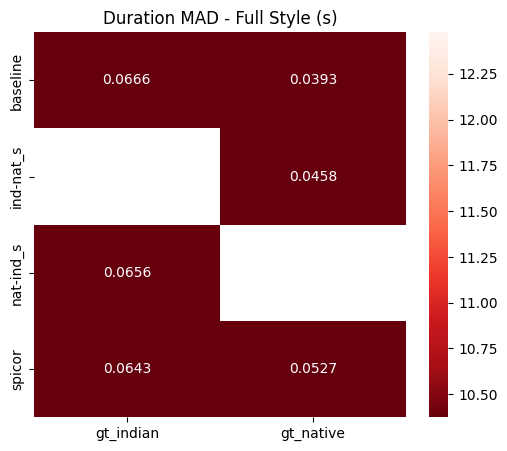

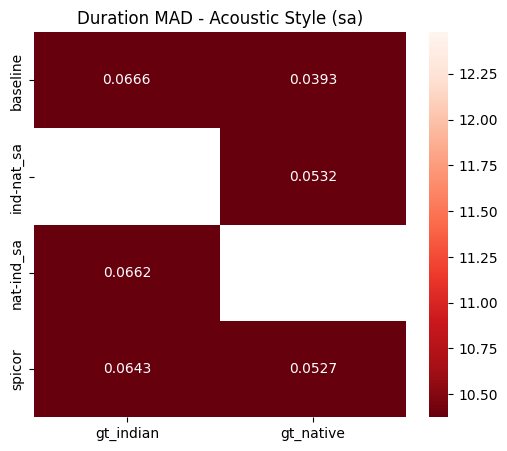

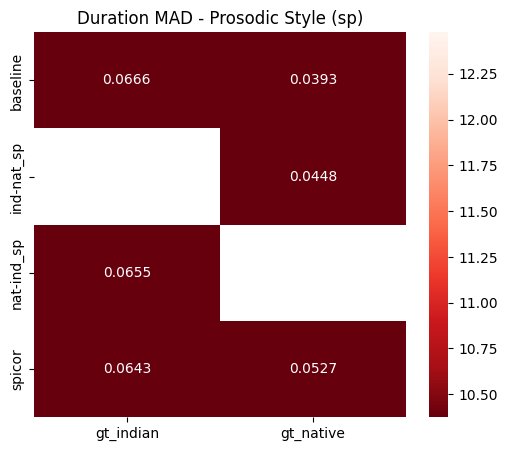


=== Tables ===

Full Style (s):


Reference,gt_indian,gt_native
Model,,
baseline,0.066555,0.039308
ind-nat_s,NaN,0.045785
nat-ind_s,0.065564,NaN
spicor,0.064345,0.052698


Acoustic Style (sa):


Reference,gt_indian,gt_native
Model,,
baseline,0.066555,0.039308
ind-nat_sa,NaN,0.053248
nat-ind_sa,0.066247,NaN
spicor,0.064345,0.052698


Prosodic Style (sp):


Reference,gt_indian,gt_native
Model,,
baseline,0.066555,0.039308
ind-nat_sp,NaN,0.044841
nat-ind_sp,0.065522,NaN
spicor,0.064345,0.052698


In [ ]:
plot_heatmap(dur_s,  "Duration MAD - Full Style (s)")
plot_heatmap(dur_sa, "Duration MAD - Acoustic Style (sa)")
plot_heatmap(dur_sp, "Duration MAD - Prosodic Style (sp)")


print("\n=== Tables ===\n")

print("Full Style (s):")
display(dur_s)

print("Acoustic Style (sa):")
display(dur_sa)

print("Prosodic Style (sp):")
display(dur_sp)

Energy RMSE

In [ ]:
# -------------------------------------------------
# ENERGY EXTRACTION
# -------------------------------------------------

def load_audio(path):
    wav, _ = librosa.load(path, sr=SR)
    return wav

def compute_energy(wav):
    return librosa.feature.rms(y=wav)[0]

def compute_rmse(x, y):
    min_len = min(len(x), len(y))
    return np.sqrt(np.mean((x[:min_len] - y[:min_len])**2))

In [ ]:
# -------------------------------------------------
# TABLE FUNCTION
# -------------------------------------------------

def compute_energy_table(variant_suffix):

    comparison_pairs = [
        ("baseline", "gt_native"),
        ("baseline", "gt_indian"),
        ("spicor", "gt_native"),
        ("spicor", "gt_indian"),
        (f"nat-ind{variant_suffix}", "gt_indian"),
        (f"ind-nat{variant_suffix}", "gt_native"),
    ]

    results = []

    for model_label, ref_label in comparison_pairs:

        scores = []

        print(f"Computing Energy RMSE: {model_label} vs {ref_label}")

        for lj_id in tqdm(master_dict.keys(), leave=False):

            if model_label not in master_dict[lj_id]:
                continue
            if ref_label not in master_dict[lj_id]:
                continue

            pred_path = master_dict[lj_id][model_label]
            ref_path = master_dict[lj_id][ref_label]

            wav_pred = load_audio(pred_path)
            wav_ref = load_audio(ref_path)

            energy_pred = compute_energy(wav_pred)
            energy_ref = compute_energy(wav_ref)

            rmse_val = compute_rmse(energy_pred, energy_ref)
            scores.append(rmse_val)

        results.append({
            "Model": model_label,
            "Reference": ref_label,
            "Energy_RMSE": np.mean(scores)
        })

    df = pd.DataFrame(results)
    pivot = df.pivot(index="Model", columns="Reference", values="Energy_RMSE")
    return pivot


# -------------------------------------------------
# COMPUTE TABLES
# -------------------------------------------------

print("\n=== Computing Energy RMSE Tables ===\n")

energy_s   = compute_energy_table("_s")
energy_sa  = compute_energy_table("_sa")
energy_sp  = compute_energy_table("_sp")



=== Computing Energy RMSE Tables ===

Computing Energy RMSE: baseline vs gt_native


Computing Energy RMSE: baseline vs gt_indian


Computing Energy RMSE: spicor vs gt_native


Computing Energy RMSE: spicor vs gt_indian


Computing Energy RMSE: nat-ind_s vs gt_indian


Computing Energy RMSE: ind-nat_s vs gt_native


Computing Energy RMSE: baseline vs gt_native


Computing Energy RMSE: baseline vs gt_indian


Computing Energy RMSE: spicor vs gt_native


Computing Energy RMSE: spicor vs gt_indian


Computing Energy RMSE: nat-ind_sa vs gt_indian


Computing Energy RMSE: ind-nat_sa vs gt_native


Computing Energy RMSE: baseline vs gt_native


Computing Energy RMSE: baseline vs gt_indian


Computing Energy RMSE: spicor vs gt_native


Computing Energy RMSE: spicor vs gt_indian


Computing Energy RMSE: nat-ind_sp vs gt_indian


Computing Energy RMSE: ind-nat_sp vs gt_native


In [ ]:
# -------------------------------------------------
# GLOBAL COLOR SCALE
# -------------------------------------------------

global_min = min(energy_s.min().min(),
                 energy_sa.min().min(),
                 energy_sp.min().min())

global_max = max(energy_s.max().max(),
                 energy_sa.max().max(),
                 energy_sp.max().max())


# -------------------------------------------------
# HEATMAP FUNCTION
# -------------------------------------------------

def plot_heatmap(table, title):
    plt.figure(figsize=(6,5))
    sns.heatmap(
        table,
        annot=True,
        fmt=".5f",
        cmap="Reds_r",   # darker = lower (better)
        vmin=global_min,
        vmax=global_max
    )
    plt.title(title)
    plt.ylabel("")
    plt.xlabel("")
    plt.show()

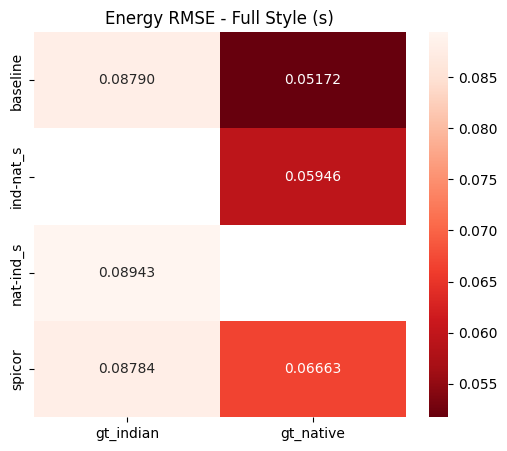

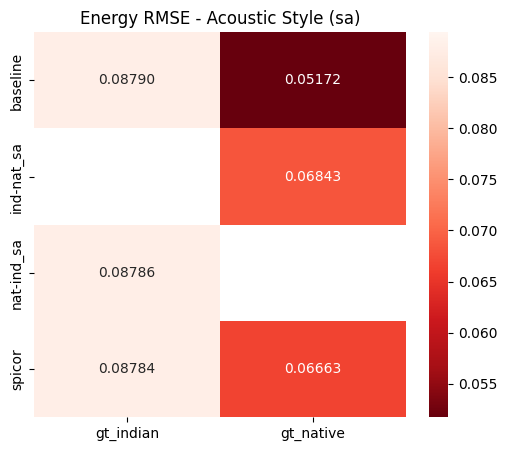

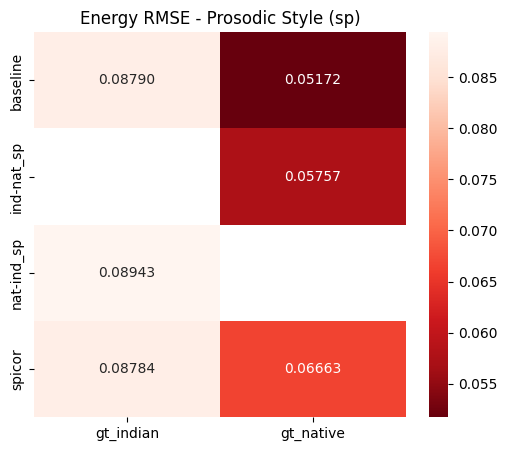


=== Tables ===

Full Style (s):


Reference,gt_indian,gt_native
Model,,
baseline,0.087896,0.051718
ind-nat_s,NaN,0.059459
nat-ind_s,0.089430,NaN
spicor,0.087845,0.066630


Acoustic Style (sa):


Reference,gt_indian,gt_native
Model,,
baseline,0.087896,0.051718
ind-nat_sa,NaN,0.068427
nat-ind_sa,0.087856,NaN
spicor,0.087845,0.066630


Prosodic Style (sp):


Reference,gt_indian,gt_native
Model,,
baseline,0.087896,0.051718
ind-nat_sp,NaN,0.057567
nat-ind_sp,0.089429,NaN
spicor,0.087845,0.066630


In [ ]:
plot_heatmap(energy_s,  "Energy RMSE - Full Style (s)")
plot_heatmap(energy_sa, "Energy RMSE - Acoustic Style (sa)")
plot_heatmap(energy_sp, "Energy RMSE - Prosodic Style (sp)")


print("\n=== Tables ===\n")

print("Full Style (s):")
display(energy_s)

print("Acoustic Style (sa):")
display(energy_sa)

print("Prosodic Style (sp):")
display(energy_sp)

Multi resolution STFT

In [ ]:
# -------------------------------------------------
# MULTI-RESOLUTION STFT
# -------------------------------------------------

fft_sizes = [512, 1024, 2048]

def load_audio(path):
    wav, _ = librosa.load(path, sr=SR)
    return wav

def compute_mrstft_loss(wav_pred, wav_ref):

    total_loss = 0.0

    for fft in fft_sizes:
        hop = fft // 4

        S_pred = np.abs(librosa.stft(wav_pred, n_fft=fft, hop_length=hop))
        S_ref  = np.abs(librosa.stft(wav_ref,  n_fft=fft, hop_length=hop))

        min_t = min(S_pred.shape[1], S_ref.shape[1])

        S_pred = S_pred[:, :min_t]
        S_ref  = S_ref[:, :min_t]

        # Magnitude L1
        mag_loss = np.mean(np.abs(S_pred - S_ref))

        # Log magnitude L1
        log_pred = np.log(S_pred + 1e-6)
        log_ref  = np.log(S_ref + 1e-6)
        log_loss = np.mean(np.abs(log_pred - log_ref))

        total_loss += mag_loss + log_loss

    return total_loss

In [ ]:
# -------------------------------------------------
# TABLE FUNCTION
# -------------------------------------------------

def compute_stft_table(variant_suffix):

    comparison_pairs = [
        ("baseline", "gt_native"),
        ("baseline", "gt_indian"),
        ("spicor", "gt_native"),
        ("spicor", "gt_indian"),
        (f"nat-ind{variant_suffix}", "gt_indian"),
        (f"ind-nat{variant_suffix}", "gt_native"),
    ]

    results = []

    for model_label, ref_label in comparison_pairs:

        scores = []

        print(f"Computing MR-STFT: {model_label} vs {ref_label}")

        for lj_id in tqdm(master_dict.keys(), leave=False):

            if model_label not in master_dict[lj_id]:
                continue
            if ref_label not in master_dict[lj_id]:
                continue

            pred_path = master_dict[lj_id][model_label]
            ref_path  = master_dict[lj_id][ref_label]

            wav_pred = load_audio(pred_path)
            wav_ref  = load_audio(ref_path)

            loss = compute_mrstft_loss(wav_pred, wav_ref)
            scores.append(loss)

        results.append({
            "Model": model_label,
            "Reference": ref_label,
            "MR_STFT": np.mean(scores)
        })

    df = pd.DataFrame(results)
    pivot = df.pivot(index="Model", columns="Reference", values="MR_STFT")
    return pivot


# -------------------------------------------------
# COMPUTE TABLES
# -------------------------------------------------

print("\n=== Computing Multi-Resolution STFT Tables ===\n")

stft_s   = compute_stft_table("_s")
stft_sa  = compute_stft_table("_sa")
stft_sp  = compute_stft_table("_sp")


=== Computing Multi-Resolution STFT Tables ===

Computing MR-STFT: baseline vs gt_native


Computing MR-STFT: baseline vs gt_indian


Computing MR-STFT: spicor vs gt_native


Computing MR-STFT: spicor vs gt_indian


Computing MR-STFT: nat-ind_s vs gt_indian


Computing MR-STFT: ind-nat_s vs gt_native


Computing MR-STFT: baseline vs gt_native


Computing MR-STFT: baseline vs gt_indian


Computing MR-STFT: spicor vs gt_native


Computing MR-STFT: spicor vs gt_indian


Computing MR-STFT: nat-ind_sa vs gt_indian


Computing MR-STFT: ind-nat_sa vs gt_native


Computing MR-STFT: baseline vs gt_native


Computing MR-STFT: baseline vs gt_indian


Computing MR-STFT: spicor vs gt_native


Computing MR-STFT: spicor vs gt_indian


Computing MR-STFT: nat-ind_sp vs gt_indian


Computing MR-STFT: ind-nat_sp vs gt_native


In [ ]:
# -------------------------------------------------
# GLOBAL COLOR SCALE
# -------------------------------------------------

global_min = min(stft_s.min().min(),
                 stft_sa.min().min(),
                 stft_sp.min().min())

global_max = max(stft_s.max().max(),
                 stft_sa.max().max(),
                 stft_sp.max().max())


# -------------------------------------------------
# HEATMAP FUNCTION
# -------------------------------------------------

def plot_heatmap(table, title):
    plt.figure(figsize=(6,5))
    sns.heatmap(
        table,
        annot=True,
        fmt=".4f",
        cmap="Reds_r",
        vmin=global_min,
        vmax=global_max
    )
    plt.title(title)
    plt.ylabel("")
    plt.xlabel("")
    plt.show()

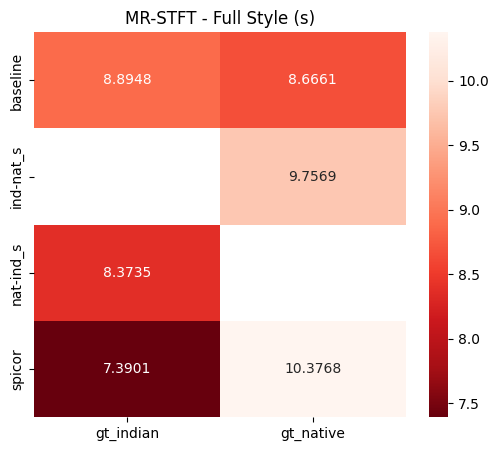

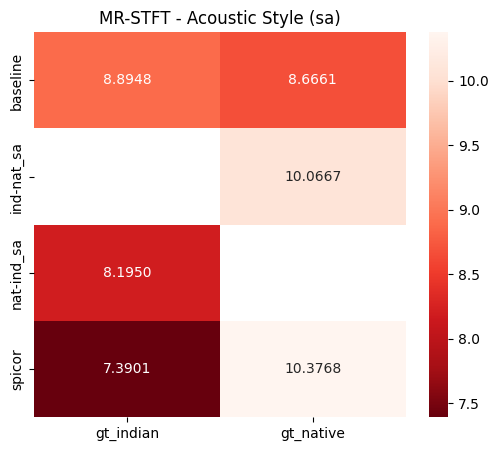

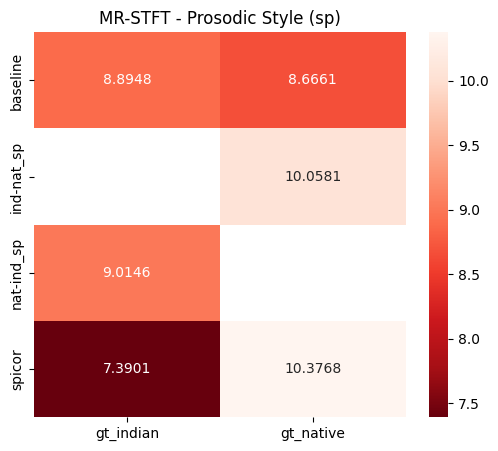


=== Tables ===

Full Style (s):


Reference,gt_indian,gt_native
Model,,
baseline,8.894759,8.666073
ind-nat_s,NaN,9.756948
nat-ind_s,8.373490,NaN
spicor,7.390143,10.376798


Acoustic Style (sa):


Reference,gt_indian,gt_native
Model,,
baseline,8.894759,8.666073
ind-nat_sa,NaN,10.066671
nat-ind_sa,8.195022,NaN
spicor,7.390143,10.376798


Prosodic Style (sp):


Reference,gt_indian,gt_native
Model,,
baseline,8.894759,8.666073
ind-nat_sp,NaN,10.058109
nat-ind_sp,9.014613,NaN
spicor,7.390143,10.376798


In [ ]:
plot_heatmap(stft_s,  "MR-STFT - Full Style (s)")
plot_heatmap(stft_sa, "MR-STFT - Acoustic Style (sa)")
plot_heatmap(stft_sp, "MR-STFT - Prosodic Style (sp)")


print("\n=== Tables ===\n")

print("Full Style (s):")
display(stft_s)

print("Acoustic Style (sa):")
display(stft_sa)

print("Prosodic Style (sp):")
display(stft_sp)

Vowel Formant Distance

In [ ]:
from scipy.signal import lfilter
from numpy.linalg import eigvals

In [ ]:
# -------------------------------------------------
# FORMANT EXTRACTION USING LPC
# -------------------------------------------------

def load_audio(path):
    wav, _ = librosa.load(path, sr=SR)
    return wav

def compute_formants(wav, sr=SR, lpc_order=12):

    # Pre-emphasis
    wav = lfilter([1, -0.97], 1, wav)

    frame_length = int(0.025 * sr)
    hop_length = int(0.010 * sr)

    formants_f1 = []
    formants_f2 = []

    for i in range(0, len(wav) - frame_length, hop_length):

        frame = wav[i:i+frame_length]
        frame = frame * np.hamming(len(frame))

        # Skip low energy frames
        if np.mean(frame**2) < 1e-6:
            continue

        try:
            A = librosa.lpc(frame, order=lpc_order)
            roots = np.roots(A)
            roots = roots[np.imag(roots) >= 0]

            angles = np.angle(roots)
            freqs = angles * (sr / (2 * np.pi))
            freqs = np.sort(freqs)

            if len(freqs) >= 2:
                f1 = freqs[0]
                f2 = freqs[1]

                if 200 < f1 < 1000 and 500 < f2 < 3000:
                    formants_f1.append(f1)
                    formants_f2.append(f2)

        except:
            continue

    if len(formants_f1) == 0:
        return None, None

    return np.mean(formants_f1), np.mean(formants_f2)


def compute_formant_distance(wav_pred, wav_ref):

    f1_pred, f2_pred = compute_formants(wav_pred)
    f1_ref,  f2_ref  = compute_formants(wav_ref)

    if None in [f1_pred, f2_pred, f1_ref, f2_ref]:
        return None

    dist = np.sqrt((f1_pred - f1_ref)**2 + (f2_pred - f2_ref)**2)
    return dist

In [ ]:
# -------------------------------------------------
# TABLE FUNCTION
# -------------------------------------------------

def compute_formant_table(variant_suffix):

    comparison_pairs = [
        ("baseline", "gt_native"),
        ("baseline", "gt_indian"),
        ("spicor", "gt_native"),
        ("spicor", "gt_indian"),
        (f"nat-ind{variant_suffix}", "gt_indian"),
        (f"ind-nat{variant_suffix}", "gt_native"),
    ]

    results = []

    for model_label, ref_label in comparison_pairs:

        scores = []

        print(f"Computing Formant Distance: {model_label} vs {ref_label}")

        for lj_id in tqdm(master_dict.keys(), leave=False):

            if model_label not in master_dict[lj_id]:
                continue
            if ref_label not in master_dict[lj_id]:
                continue

            pred_path = master_dict[lj_id][model_label]
            ref_path  = master_dict[lj_id][ref_label]

            wav_pred = load_audio(pred_path)
            wav_ref  = load_audio(ref_path)

            dist = compute_formant_distance(wav_pred, wav_ref)

            if dist is not None:
                scores.append(dist)

        results.append({
            "Model": model_label,
            "Reference": ref_label,
            "Formant_Dist": np.mean(scores)
        })

    df = pd.DataFrame(results)
    pivot = df.pivot(index="Model", columns="Reference", values="Formant_Dist")
    return pivot


# -------------------------------------------------
# COMPUTE TABLES
# -------------------------------------------------

print("\n=== Computing Vowel Formant Distance Tables ===\n")

form_s   = compute_formant_table("_s")
form_sa  = compute_formant_table("_sa")
form_sp  = compute_formant_table("_sp")


=== Computing Vowel Formant Distance Tables ===

Computing Formant Distance: baseline vs gt_native


Computing Formant Distance: baseline vs gt_indian


Computing Formant Distance: spicor vs gt_native


Computing Formant Distance: spicor vs gt_indian


Computing Formant Distance: nat-ind_s vs gt_indian


Computing Formant Distance: ind-nat_s vs gt_native


Computing Formant Distance: baseline vs gt_native


Computing Formant Distance: baseline vs gt_indian


Computing Formant Distance: spicor vs gt_native


Computing Formant Distance: spicor vs gt_indian


Computing Formant Distance: nat-ind_sa vs gt_indian


Computing Formant Distance: ind-nat_sa vs gt_native


Computing Formant Distance: baseline vs gt_native


Computing Formant Distance: baseline vs gt_indian


Computing Formant Distance: spicor vs gt_native


Computing Formant Distance: spicor vs gt_indian


Computing Formant Distance: nat-ind_sp vs gt_indian


Computing Formant Distance: ind-nat_sp vs gt_native


In [ ]:
# -------------------------------------------------
# GLOBAL COLOR SCALE
# -------------------------------------------------

global_min = min(form_s.min().min(),
                 form_sa.min().min(),
                 form_sp.min().min())

global_max = max(form_s.max().max(),
                 form_sa.max().max(),
                 form_sp.max().max())


# -------------------------------------------------
# HEATMAP FUNCTION
# -------------------------------------------------

def plot_heatmap(table, title):
    plt.figure(figsize=(6,5))
    sns.heatmap(
        table,
        annot=True,
        fmt=".2f",
        cmap="Reds_r",
        vmin=global_min,
        vmax=global_max
    )
    plt.title(title)
    plt.ylabel("")
    plt.xlabel("")
    plt.show()

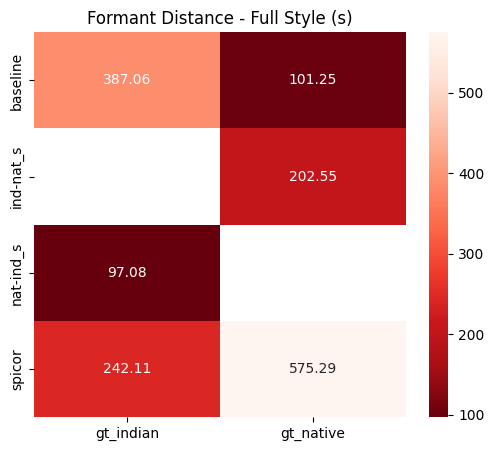

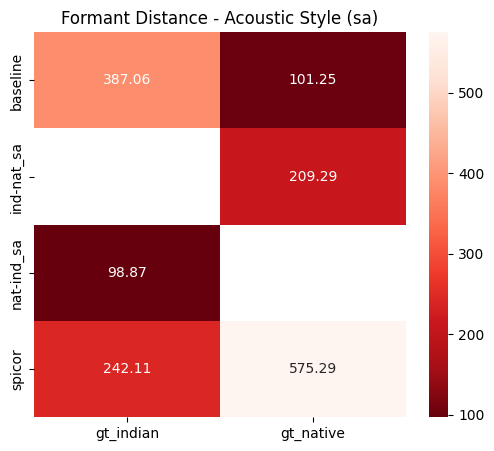

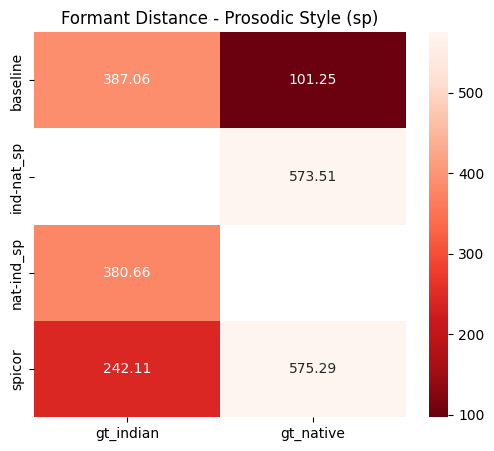


=== Tables ===



Reference,gt_indian,gt_native
Model,,
baseline,387.055695,101.248449
ind-nat_s,NaN,202.545866
nat-ind_s,97.081526,NaN
spicor,242.114455,575.294541


Reference,gt_indian,gt_native
Model,,
baseline,387.055695,101.248449
ind-nat_sa,NaN,209.291037
nat-ind_sa,98.871725,NaN
spicor,242.114455,575.294541


Reference,gt_indian,gt_native
Model,,
baseline,387.055695,101.248449
ind-nat_sp,NaN,573.514890
nat-ind_sp,380.658219,NaN
spicor,242.114455,575.294541


In [ ]:
plot_heatmap(form_s,  "Formant Distance - Full Style (s)")
plot_heatmap(form_sa, "Formant Distance - Acoustic Style (sa)")
plot_heatmap(form_sp, "Formant Distance - Prosodic Style (sp)")


print("\n=== Tables ===\n")

display(form_s)
display(form_sa)
display(form_sp)

PPG

In [ ]:
!pip install transformers torchaudio fastdtw --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 5.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
import torch
import torchaudio
import os
import numpy as np
from transformers import Wav2Vec2Processor, Wav2Vec2ForCTC
from tqdm import tqdm

device = "cuda" if torch.cuda.is_available() else "cpu"

processor = Wav2Vec2Processor.from_pretrained("facebook/wav2vec2-base-960h")
model = Wav2Vec2ForCTC.from_pretrained("facebook/wav2vec2-base-960h").to(device)
model.eval()

print("Wav2Vec2 loaded.")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/159 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/163 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/291 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/85.0 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/378M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/212 [00:00<?, ?it/s]

Wav2Vec2ForCTC LOAD REPORT from: facebook/wav2vec2-base-960h
Key                        | Status  | 
---------------------------+---------+-
wav2vec2.masked_spec_embed | MISSING | 

Notes:
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Wav2Vec2 loaded.


In [ ]:
PPG_CACHE_ROOT = "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/ppg_cache"
os.makedirs(PPG_CACHE_ROOT, exist_ok=True)

print("PPG cache directory:", PPG_CACHE_ROOT)

PPG cache directory: /content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/ppg_cache


In [ ]:
def extract_ppg(path):

    waveform, sr = torchaudio.load(path)

    if sr != 16000:
        waveform = torchaudio.functional.resample(waveform, sr, 16000)

    waveform = waveform.squeeze().to(device)

    inputs = processor(waveform, sampling_rate=16000, return_tensors="pt")
    input_values = inputs.input_values.to(device)

    with torch.no_grad():
        logits = model(input_values).logits

    probs = torch.softmax(logits, dim=-1)
    ppg = probs.squeeze(0).cpu().numpy()

    return ppg

In [ ]:
for lj_id in tqdm(master_dict.keys()):

    for label, path in master_dict[lj_id].items():

        # Create label folder
        label_dir = os.path.join(PPG_CACHE_ROOT, label)
        os.makedirs(label_dir, exist_ok=True)

        save_path = os.path.join(label_dir, lj_id + ".npy")

        if os.path.exists(save_path):
            continue  # already cached

        try:
            ppg = extract_ppg(path)
            np.save(save_path, ppg)
        except Exception as e:
            print("Error:", lj_id, label, e)

print("PPG caching complete.")

100%|██████████| 238/238 [02:32<00:00,  1.56it/s]

PPG caching complete.


In [ ]:
from fastdtw import fastdtw
from scipy.spatial.distance import cosine

def compute_ppg_dtw(ppg1, ppg2):

    distance, path = fastdtw(ppg1, ppg2, dist=cosine)

    return distance / len(path)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def compute_ppg_table(variant_suffix):

    comparison_pairs = [
        ("baseline", "gt_native"),
        ("baseline", "gt_indian"),
        ("spicor", "gt_native"),
        ("spicor", "gt_indian"),
        (f"nat-ind{variant_suffix}", "gt_indian"),
        (f"ind-nat{variant_suffix}", "gt_native"),
    ]

    results = []

    for model_label, ref_label in comparison_pairs:

        scores = []

        print(f"Computing PPG-DTW: {model_label} vs {ref_label}")

        for lj_id in master_dict.keys():

            pred_path = os.path.join(PPG_CACHE_ROOT, model_label, lj_id + ".npy")
            ref_path  = os.path.join(PPG_CACHE_ROOT, ref_label, lj_id + ".npy")

            if not os.path.exists(pred_path) or not os.path.exists(ref_path):
                continue

            ppg_pred = np.load(pred_path)
            ppg_ref  = np.load(ref_path)

            dist = compute_ppg_dtw(ppg_pred, ppg_ref)
            scores.append(dist)

        results.append({
            "Model": model_label,
            "Reference": ref_label,
            "PPG_DTW": np.mean(scores)
        })

    df = pd.DataFrame(results)
    return df.pivot(index="Model", columns="Reference", values="PPG_DTW")

Computing PPG-DTW: baseline vs gt_native
Computing PPG-DTW: baseline vs gt_indian
Computing PPG-DTW: spicor vs gt_native
Computing PPG-DTW: spicor vs gt_indian
Computing PPG-DTW: nat-ind_s vs gt_indian
Computing PPG-DTW: ind-nat_s vs gt_native
Computing PPG-DTW: baseline vs gt_native
Computing PPG-DTW: baseline vs gt_indian
Computing PPG-DTW: spicor vs gt_native
Computing PPG-DTW: spicor vs gt_indian
Computing PPG-DTW: nat-ind_sa vs gt_indian
Computing PPG-DTW: ind-nat_sa vs gt_native
Computing PPG-DTW: baseline vs gt_native
Computing PPG-DTW: baseline vs gt_indian
Computing PPG-DTW: spicor vs gt_native
Computing PPG-DTW: spicor vs gt_indian
Computing PPG-DTW: nat-ind_sp vs gt_indian
Computing PPG-DTW: ind-nat_sp vs gt_native


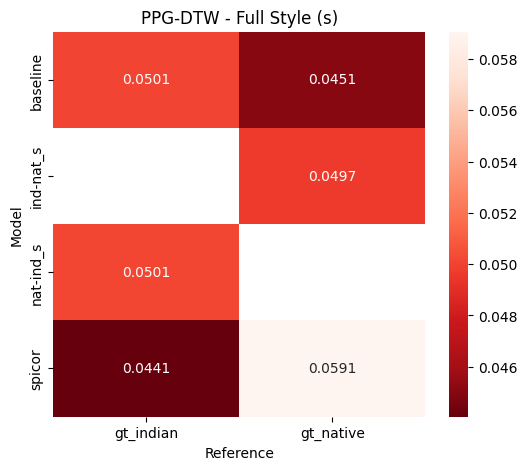

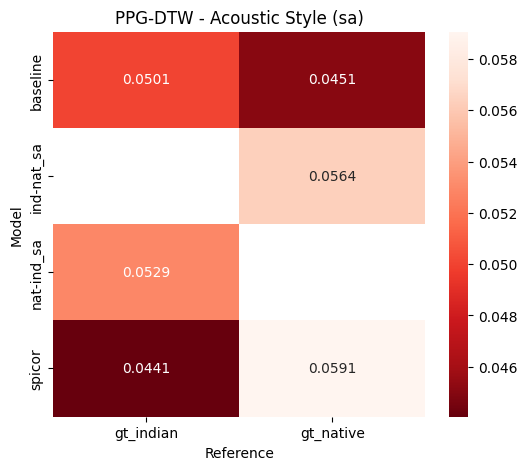

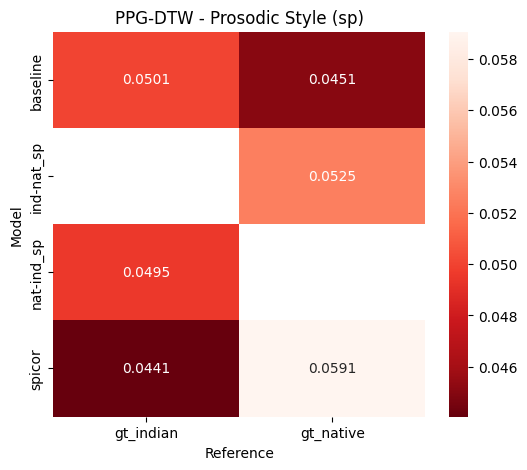

In [ ]:
ppg_s  = compute_ppg_table("_s")
ppg_sa = compute_ppg_table("_sa")
ppg_sp = compute_ppg_table("_sp")

global_min = min(ppg_s.min().min(),
                 ppg_sa.min().min(),
                 ppg_sp.min().min())

global_max = max(ppg_s.max().max(),
                 ppg_sa.max().max(),
                 ppg_sp.max().max())

def plot_heatmap(table, title):
    plt.figure(figsize=(6,5))
    sns.heatmap(
        table,
        annot=True,
        fmt=".4f",
        cmap="Reds_r",
        vmin=global_min,
        vmax=global_max
    )
    plt.title(title)
    plt.show()

plot_heatmap(ppg_s,  "PPG-DTW - Full Style (s)")
plot_heatmap(ppg_sa, "PPG-DTW - Acoustic Style (sa)")
plot_heatmap(ppg_sp, "PPG-DTW - Prosodic Style (sp)")

# Style Transfer efficient


Style Transfer TTS Evaluation Script
=====================================
Metrics: MCD, Log F0 RMSE, Duration MAD, Energy RMSE, MR-STFT, Formant Distance, PPG-DTW

Corrections vs original:
  - Log F0 RMSE  : voiced-only frames + DTW alignment (not raw truncation)
  - Duration MAD : actual segment durations via energy-based VAD (not frame-level energy MAD)
  - Energy RMSE  : log-energy (dB) + DTW alignment (not linear RMS truncation)
  - MR-STFT      : separated spectral convergence loss + log STFT magnitude loss (Yamamoto 2020)
  - Formant Dist : bark-scale weighted F1/F2 distance (standard in TTS evaluation)
  - PPG-DTW      : unchanged (already correct)


In [ ]:
!pip install fastdtw

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for fastdtw: filename=fastdtw-0.3.4-cp312-cp312-linux_x86_64.whl size=567860 sha256=6331299cdfa138dbbce348eccbf648df4691781190ab026e780fc784547f34ad
  Stored in directory: /root/.cache/pip/wheels/ab/d0/26/b82cb0f49ae73e5e6bba4e8462fff2c9851d7bd2ec64f8891e
Successfully built fastdtw


In [ ]:
import os
import re
import numpy as np
import librosa
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
from scipy.signal import lfilter
from fastdtw import fastdtw

In [ ]:
SR = 24000
N_MELS = 80
N_MFCC = 13
ALPHA = (10 * np.sqrt(2)) / np.log(10)
print(ALPHA)

6.141851463713754


In [ ]:
folder_map = {
    "baseline":  "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/baseline_lj/audio_files",
    "spicor":    "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/spicor_full_no_slm/audio_files",
    "gt_native": "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/gt_native/audio_files",
    "gt_indian": "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/gt_indian_matching/audio_files",
    "ind-nat":   "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/ind-nat/audio_files",
    "nat-ind":   "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/nat-ind/audio_files",
}

PPG_CACHE_ROOT = "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/Results_finetuned/ppg_cache"


In [ ]:
# =====================================================
# MASTER DICT
# =====================================================

def extract_lj_id(filename):
    match = re.search(r"(LJ\d{3}-\d{4})", filename)
    return match.group(1) if match else None


def build_master_dict(folder_map):
    master_dict = {}
    for label, folder in folder_map.items():
        if not os.path.exists(folder):
            print(f"[WARNING] Folder not found: {folder}")
            continue
        for f in os.listdir(folder):
            if not f.endswith(".wav"):
                continue
            lj_id = extract_lj_id(f)
            if lj_id is None:
                continue
            master_dict.setdefault(lj_id, {})
            full_path = os.path.join(folder, f)
            if label in ["nat-ind", "ind-nat"]:
                variant = f.replace(lj_id, "").replace(".wav", "")
                master_dict[lj_id][f"{label}{variant}"] = full_path
            else:
                master_dict[lj_id][label] = full_path
    return master_dict


master_dict = build_master_dict(folder_map)
print(f"Total aligned LJ IDs: {len(master_dict)}")


def get_comparison_pairs(variant_suffix):
    return [
        ("baseline",                  "gt_native"),
        ("baseline",                  "gt_indian"),
        ("spicor",                    "gt_native"),
        ("spicor",                    "gt_indian"),
        (f"nat-ind{variant_suffix}",  "gt_indian"),
        (f"ind-nat{variant_suffix}",  "gt_native"),
    ]

Total aligned LJ IDs: 238


In [ ]:
# =====================================================
# AUDIO LOADING
# =====================================================

def load_audio(path, sr=SR):
    wav, _ = librosa.load(path, sr=sr)
    return wav

In [ ]:
# =====================================================
# UNIFIED PLOT FUNCTION
# =====================================================

def plot_heatmap(table, title, fmt=".4f", cmap="Reds_r",
                 vmin=None, vmax=None, figsize=(6, 5)):
    """
    Plot a single heatmap table.

    Parameters
    ----------
    table  : pd.DataFrame  pivot table (model x reference)
    title  : str           plot title
    fmt    : str           annotation format string (e.g. ".3f", ".2f")
    cmap   : str           colormap (default "Reds_r" → darker = lower = better)
    vmin   : float|None    global min for consistent color scale
    vmax   : float|None    global max for consistent color scale
    figsize: tuple         figure size
    """
    plt.figure(figsize=figsize)
    sns.heatmap(
        table,
        annot=True,
        fmt=fmt,
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
    )
    plt.title(title, fontsize=13, pad=12)
    plt.ylabel("Model",     fontsize=11)
    plt.xlabel("Reference", fontsize=11)
    plt.tight_layout()
    plt.show()


def plot_metric_heatmaps(tables_dict, metric_name, fmt=".4f", cmap="Reds_r"):
    """
    Plot heatmaps for all three style variants of a given metric with a shared
    color scale.

    Parameters
    ----------
    tables_dict : dict  {"_s": df, "_sa": df, "_sp": df}
    metric_name : str   e.g. "MCD", "Log F0 RMSE"
    fmt         : str   annotation format
    cmap        : str   colormap
    """
    suffix_label = {"_s": "Full Style (s)", "_sa": "Acoustic Style (sa)", "_sp": "Prosodic Style (sp)"}

    all_vals = pd.concat(tables_dict.values())
    vmin = all_vals.min().min()
    vmax = all_vals.max().max()

    for suffix, table in tables_dict.items():
        plot_heatmap(
            table,
            title=f"{metric_name} — {suffix_label[suffix]}",
            fmt=fmt,
            cmap=cmap,
            vmin=vmin,
            vmax=vmax,
        )
        print(f"\n{metric_name} [{suffix_label[suffix]}]:")
        display(table)

In [ ]:
# =====================================================
# GENERIC TABLE RUNNER
# =====================================================

def compute_metric_tables(score_fn, metric_col, variant_suffixes=("_s", "_sa", "_sp")):
    """
    Run score_fn over all comparison pairs and variants, return {suffix: pivot_df}.

    score_fn(wav_pred, wav_ref) -> float | None
    metric_col                  -> column name in result df
    """
    tables = {}
    for suffix in variant_suffixes:
        results = []
        pairs = get_comparison_pairs(suffix)

        for model_label, ref_label in pairs:
            scores = []
            print(f"  [{suffix}] {model_label} vs {ref_label}")

            for lj_id in tqdm(master_dict.keys(), leave=False):
                if model_label not in master_dict[lj_id]:
                    continue
                if ref_label not in master_dict[lj_id]:
                    continue

                wav_pred = load_audio(master_dict[lj_id][model_label])
                wav_ref  = load_audio(master_dict[lj_id][ref_label])

                val = score_fn(wav_pred, wav_ref)
                if val is not None:
                    scores.append(val)

            results.append({
                "Model":     model_label,
                "Reference": ref_label,
                metric_col:  np.mean(scores) if scores else np.nan,
            })

        df = pd.DataFrame(results)
        tables[suffix] = df.pivot(index="Model", columns="Reference", values=metric_col)

    return tables

In [ ]:
# =====================================================
# 1. MCD  (unchanged — already correct)
# =====================================================

def compute_mfcc(wav):
    mel     = librosa.feature.melspectrogram(y=wav, sr=SR, n_mels=N_MELS, fmin=0, fmax=SR // 2)
    log_mel = np.log10(np.maximum(mel, 1e-10))
    mfcc    = librosa.feature.mfcc(S=log_mel, n_mfcc=N_MFCC + 1)[1:]  # skip C0
    return mfcc


def mcd_score(wav_pred, wav_ref):
    m1, m2 = compute_mfcc(wav_pred), compute_mfcc(wav_ref)
    _, path = fastdtw(m1.T, m2.T, dist=lambda a, b: np.linalg.norm(a - b))
    frames  = np.array([(m1[:, i] - m2[:, j]) for i, j in path])
    return float(ALPHA * np.sqrt(np.sum(frames ** 2, axis=1)).mean())

In [ ]:
# =====================================================
# 2. Log F0 RMSE — voiced frames only + DTW alignment
#
#    Standard in TTS evaluation (e.g. Shen et al. 2018 Tacotron 2,
#    Li et al. FastSpeech):
#      - extract F0 with PYIN
#      - keep only voiced frames (F0 > 0)
#      - DTW-align the voiced sequences
#      - RMSE on log-F0
# =====================================================

def extract_voiced_log_f0(wav, sr=SR):
    """Returns log-F0 for voiced frames only (unvoiced dropped)."""
    f0, voiced_flag, _ = librosa.pyin(wav, fmin=50, fmax=500, sr=sr)
    f0_voiced = f0[voiced_flag & ~np.isnan(f0) & (f0 > 0)]
    return np.log(f0_voiced + 1e-8)


def logf0_rmse_score(wav_pred, wav_ref):
    lf0_pred = extract_voiced_log_f0(wav_pred)
    lf0_ref  = extract_voiced_log_f0(wav_ref)
    if len(lf0_pred) == 0 or len(lf0_ref) == 0:
        return None
    # DTW-align voiced sequences
    _, path  = fastdtw(lf0_pred.reshape(-1, 1), lf0_ref.reshape(-1, 1),
                       dist=lambda a, b: abs(a[0] - b[0]))
    diff     = np.array([(lf0_pred[i] - lf0_ref[j]) ** 2 for i, j in path])
    return float(np.sqrt(diff.mean()))

In [ ]:
# =====================================================
# 3. Duration MAD — segment-level durations via VAD
#
#    Standard approach (e.g. used in ESPnet, NVIDIA TTS evals):
#      - detect speech segments via energy-based VAD
#      - compute duration of each segment
#      - align segment lists (pad to equal length)
#      - MAD between aligned segment durations (in seconds)
# =====================================================

def get_segment_durations(wav, sr=SR, frame_len=0.025, hop_len=0.010,
                           energy_threshold_db=-35):
    """
    Returns list of segment durations (seconds) via simple energy VAD.
    """
    frame_samples = int(frame_len * sr)
    hop_samples   = int(hop_len  * sr)

    energy_db = librosa.amplitude_to_db(
        librosa.feature.rms(y=wav, frame_length=frame_samples, hop_length=hop_samples)[0],
        ref=np.max
    )

    voiced = energy_db > energy_threshold_db
    durations = []
    in_segment = False
    seg_start  = 0

    for i, v in enumerate(voiced):
        if v and not in_segment:
            in_segment = True
            seg_start  = i
        elif not v and in_segment:
            in_segment  = False
            dur_sec     = (i - seg_start) * hop_len
            durations.append(dur_sec)

    if in_segment:
        durations.append((len(voiced) - seg_start) * hop_len)

    return np.array(durations) if durations else np.array([0.0])


def duration_mad_score(wav_pred, wav_ref):
    d_pred = get_segment_durations(wav_pred)
    d_ref  = get_segment_durations(wav_ref)
    # Align to minimum number of segments
    min_len = min(len(d_pred), len(d_ref))
    if min_len == 0:
        return None
    return float(np.mean(np.abs(d_pred[:min_len] - d_ref[:min_len])))

In [ ]:
# =====================================================
# 4. Energy RMSE — log-energy (dB) + DTW alignment
#
#    Standard: use log-scale energy (perceptually motivated),
#    DTW-align frame sequences (Yamagishi et al., standard in Blizzard Challenge).
# =====================================================

def compute_log_energy(wav, sr=SR, frame_length=512, hop_length=128):
    rms      = librosa.feature.rms(y=wav, frame_length=frame_length, hop_length=hop_length)[0]
    log_rms  = librosa.amplitude_to_db(rms, ref=np.max)   # dB, normalised
    return log_rms


def energy_rmse_score(wav_pred, wav_ref):
    e_pred = compute_log_energy(wav_pred)
    e_ref  = compute_log_energy(wav_ref)
    # DTW align
    _, path = fastdtw(e_pred.reshape(-1, 1), e_ref.reshape(-1, 1),
                      dist=lambda a, b: abs(a[0] - b[0]))
    diff    = np.array([(e_pred[i] - e_ref[j]) ** 2 for i, j in path])
    return float(np.sqrt(diff.mean()))

In [ ]:
# =====================================================
# 6. Vowel Formant Distance — Bark-scale F1/F2
#
#    Standard psychoacoustic weighting converts Hz → Bark before
#    computing Euclidean distance, as used in speaker similarity
#    and accent transfer evaluations (e.g. Zhao et al. 2019).
#
#    Bark(f) = 13 * arctan(0.00076*f) + 3.5 * arctan((f/7500)^2)
# =====================================================

def hz_to_bark(f):
    return 13 * np.arctan(0.00076 * f) + 3.5 * np.arctan((f / 7500) ** 2)


def compute_formants_lpc(wav, sr=SR, lpc_order=12):
    wav = lfilter([1, -0.97], 1, wav)       # pre-emphasis
    frame_len = int(0.025 * sr)
    hop_len   = int(0.010 * sr)
    f1_list, f2_list = [], []

    for i in range(0, len(wav) - frame_len, hop_len):
        frame = wav[i:i + frame_len] * np.hamming(frame_len)
        if np.mean(frame ** 2) < 1e-6:
            continue
        try:
            A     = librosa.lpc(frame, order=lpc_order)
            roots = np.roots(A)
            roots = roots[np.imag(roots) >= 0]
            angles = np.angle(roots)
            freqs  = np.sort(angles * (sr / (2 * np.pi)))
            if len(freqs) >= 2 and 200 < freqs[0] < 1000 and 500 < freqs[1] < 3000:
                f1_list.append(freqs[0])
                f2_list.append(freqs[1])
        except Exception:
            continue

    if not f1_list:
        return None, None
    return float(np.mean(f1_list)), float(np.mean(f2_list))


def formant_distance_score(wav_pred, wav_ref):
    f1p, f2p = compute_formants_lpc(wav_pred)
    f1r, f2r = compute_formants_lpc(wav_ref)
    if None in (f1p, f2p, f1r, f2r):
        return None
    # Bark-scale distance
    b1p, b2p = hz_to_bark(f1p), hz_to_bark(f2p)
    b1r, b2r = hz_to_bark(f1r), hz_to_bark(f2r)
    return float(np.sqrt((b1p - b1r) ** 2 + (b2p - b2r) ** 2))

In [ ]:
# =====================================================
# 7. PPG-DTW  (wav2vec2 — unchanged from original)
# =====================================================
# Run separately (GPU recommended). Cache PPGs first, then call compute_ppg_tables().

try:
    import torch, torchaudio
    from transformers import Wav2Vec2Processor, Wav2Vec2ForCTC
    from scipy.spatial.distance import cosine as cosine_dist

    _device    = "cuda" if torch.cuda.is_available() else "cpu"
    _processor = Wav2Vec2Processor.from_pretrained("facebook/wav2vec2-base-960h")
    _ppg_model = Wav2Vec2ForCTC.from_pretrained("facebook/wav2vec2-base-960h").to(_device)
    _ppg_model.eval()
    print("Wav2Vec2 loaded.")
    PPG_AVAILABLE = True
except Exception as e:
    print(f"Wav2Vec2 not available: {e}")
    PPG_AVAILABLE = False


def extract_ppg(path):
    waveform, sr = torchaudio.load(path)
    if sr != 16000:
        waveform = torchaudio.functional.resample(waveform, sr, 16000)
    waveform = waveform.squeeze().to(_device)
    inputs   = _processor(waveform, sampling_rate=16000, return_tensors="pt")
    with torch.no_grad():
        logits = _ppg_model(inputs.input_values.to(_device)).logits
    return torch.softmax(logits, dim=-1).squeeze(0).cpu().numpy()


def cache_ppgs(master_dict, ppg_cache_root=PPG_CACHE_ROOT):
    os.makedirs(ppg_cache_root, exist_ok=True)
    for lj_id in tqdm(master_dict.keys()):
        for label, path in master_dict[lj_id].items():
            label_dir = os.path.join(ppg_cache_root, label)
            os.makedirs(label_dir, exist_ok=True)
            save_path = os.path.join(label_dir, lj_id + ".npy")
            if os.path.exists(save_path):
                continue
            try:
                np.save(save_path, extract_ppg(path))
            except Exception as e:
                print(f"PPG error: {lj_id} / {label}: {e}")
    print("PPG caching complete.")


def ppg_dtw_score_from_cache(lj_id, model_label, ref_label, ppg_cache_root=PPG_CACHE_ROOT):
    p = os.path.join(ppg_cache_root, model_label, lj_id + ".npy")
    r = os.path.join(ppg_cache_root, ref_label,   lj_id + ".npy")
    if not os.path.exists(p) or not os.path.exists(r):
        return None
    ppg1 = np.load(p)
    ppg2 = np.load(r)
    dist, path = fastdtw(ppg1, ppg2, dist=cosine_dist)
    return dist / len(path)   # normalise by path length


def compute_ppg_tables(variant_suffixes=("_s", "_sa", "_sp"),
                       ppg_cache_root=PPG_CACHE_ROOT):
    tables = {}
    for suffix in variant_suffixes:
        results = []
        for model_label, ref_label in get_comparison_pairs(suffix):
            scores = []
            print(f"  [{suffix}] PPG-DTW: {model_label} vs {ref_label}")
            for lj_id in master_dict.keys():
                val = ppg_dtw_score_from_cache(lj_id, model_label, ref_label,
                                               ppg_cache_root)
                if val is not None:
                    scores.append(val)
            results.append({
                "Model":     model_label,
                "Reference": ref_label,
                "PPG_DTW":   np.mean(scores) if scores else np.nan,
            })
        df = pd.DataFrame(results)
        tables[suffix] = df.pivot(index="Model", columns="Reference", values="PPG_DTW")
    return tables

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/159 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/163 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/291 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/85.0 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/378M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/212 [00:00<?, ?it/s]

Wav2Vec2ForCTC LOAD REPORT from: facebook/wav2vec2-base-960h
Key                        | Status  | 
---------------------------+---------+-
wav2vec2.masked_spec_embed | MISSING | 

Notes:
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Wav2Vec2 loaded.



  1 / 6   MCD
  [_s] baseline vs gt_native


  [_s] baseline vs gt_indian


  [_s] spicor vs gt_native


  [_s] spicor vs gt_indian


  [_s] nat-ind_s vs gt_indian


  [_s] ind-nat_s vs gt_native


  [_sa] baseline vs gt_native


  [_sa] baseline vs gt_indian


  [_sa] spicor vs gt_native


  [_sa] spicor vs gt_indian


  [_sa] nat-ind_sa vs gt_indian


  [_sa] ind-nat_sa vs gt_native


  [_sp] baseline vs gt_native


  [_sp] baseline vs gt_indian


  [_sp] spicor vs gt_native


  [_sp] spicor vs gt_indian


  [_sp] nat-ind_sp vs gt_indian


  [_sp] ind-nat_sp vs gt_native


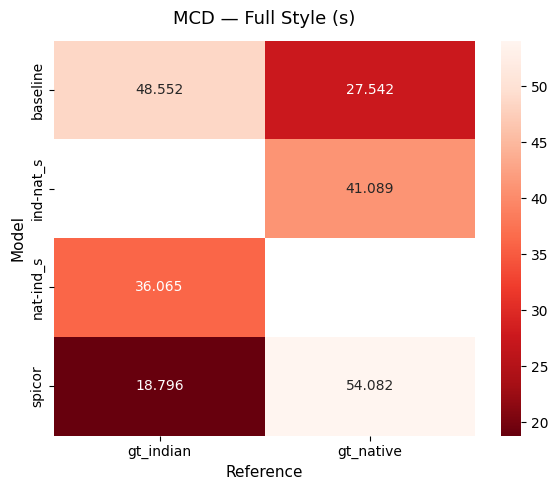


MCD [Full Style (s)]:


Reference,gt_indian,gt_native
Model,,
baseline,48.551644,27.541588
ind-nat_s,NaN,41.088597
nat-ind_s,36.064586,NaN
spicor,18.795714,54.082106


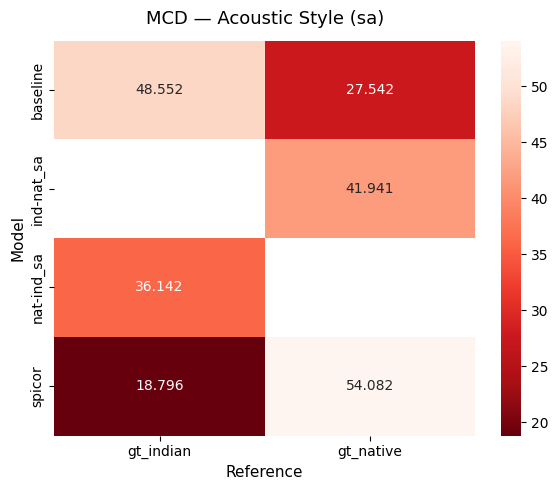


MCD [Acoustic Style (sa)]:


Reference,gt_indian,gt_native
Model,,
baseline,48.551644,27.541588
ind-nat_sa,NaN,41.941311
nat-ind_sa,36.142404,NaN
spicor,18.795714,54.082106


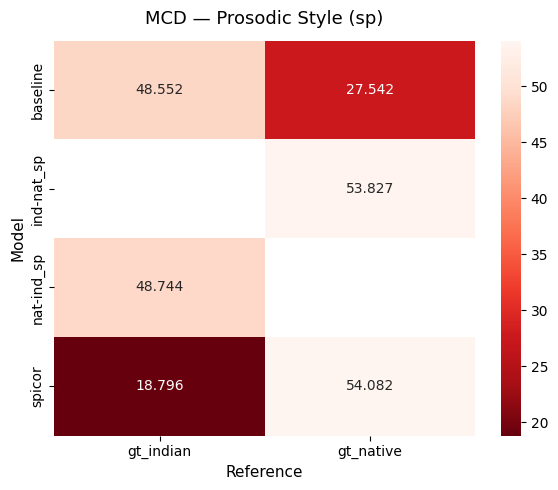


MCD [Prosodic Style (sp)]:


Reference,gt_indian,gt_native
Model,,
baseline,48.551644,27.541588
ind-nat_sp,NaN,53.826649
nat-ind_sp,48.744094,NaN
spicor,18.795714,54.082106



  2 / 6   Log F0 RMSE  (voiced + DTW)
  [_s] baseline vs gt_native


  [_s] baseline vs gt_indian


  [_s] spicor vs gt_native


  [_s] spicor vs gt_indian


  [_s] nat-ind_s vs gt_indian


  [_s] ind-nat_s vs gt_native


  [_sa] baseline vs gt_native


  [_sa] baseline vs gt_indian


  [_sa] spicor vs gt_native


  [_sa] spicor vs gt_indian


  [_sa] nat-ind_sa vs gt_indian


  [_sa] ind-nat_sa vs gt_native


  [_sp] baseline vs gt_native


  [_sp] baseline vs gt_indian


  [_sp] spicor vs gt_native


  [_sp] spicor vs gt_indian


  [_sp] nat-ind_sp vs gt_indian


  [_sp] ind-nat_sp vs gt_native


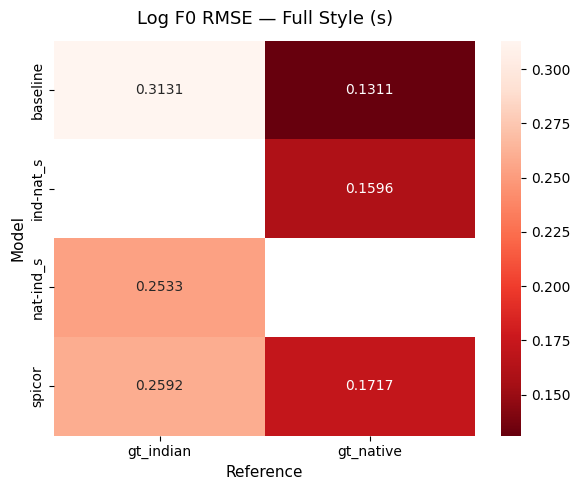


Log F0 RMSE [Full Style (s)]:


Reference,gt_indian,gt_native
Model,,
baseline,0.313140,0.131078
ind-nat_s,NaN,0.159585
nat-ind_s,0.253326,NaN
spicor,0.259209,0.171694


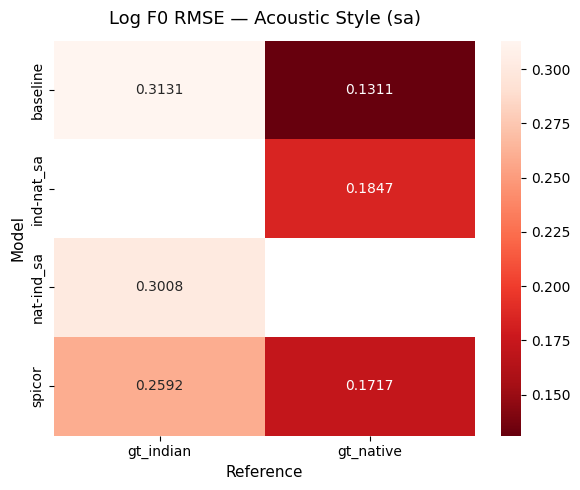


Log F0 RMSE [Acoustic Style (sa)]:


Reference,gt_indian,gt_native
Model,,
baseline,0.313140,0.131078
ind-nat_sa,NaN,0.184721
nat-ind_sa,0.300763,NaN
spicor,0.259209,0.171694


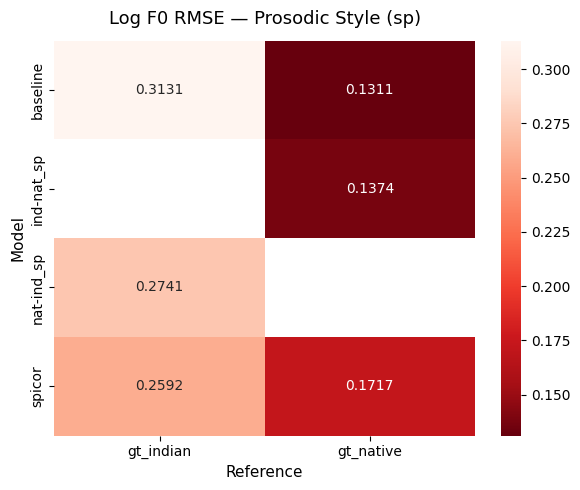


Log F0 RMSE [Prosodic Style (sp)]:


Reference,gt_indian,gt_native
Model,,
baseline,0.313140,0.131078
ind-nat_sp,NaN,0.137354
nat-ind_sp,0.274068,NaN
spicor,0.259209,0.171694



  3 / 6   Duration MAD  (VAD segment durations)
  [_s] baseline vs gt_native


  [_s] baseline vs gt_indian


  [_s] spicor vs gt_native


  [_s] spicor vs gt_indian


  [_s] nat-ind_s vs gt_indian


  [_s] ind-nat_s vs gt_native


  [_sa] baseline vs gt_native


  [_sa] baseline vs gt_indian


  [_sa] spicor vs gt_native


  [_sa] spicor vs gt_indian


  [_sa] nat-ind_sa vs gt_indian


  [_sa] ind-nat_sa vs gt_native


  [_sp] baseline vs gt_native


  [_sp] baseline vs gt_indian


  [_sp] spicor vs gt_native


  [_sp] spicor vs gt_indian


  [_sp] nat-ind_sp vs gt_indian


  [_sp] ind-nat_sp vs gt_native


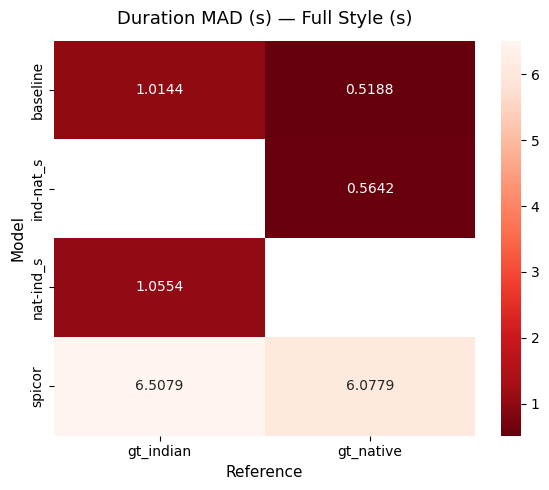


Duration MAD (s) [Full Style (s)]:


Reference,gt_indian,gt_native
Model,,
baseline,1.014446,0.518841
ind-nat_s,NaN,0.564153
nat-ind_s,1.055399,NaN
spicor,6.507941,6.077941


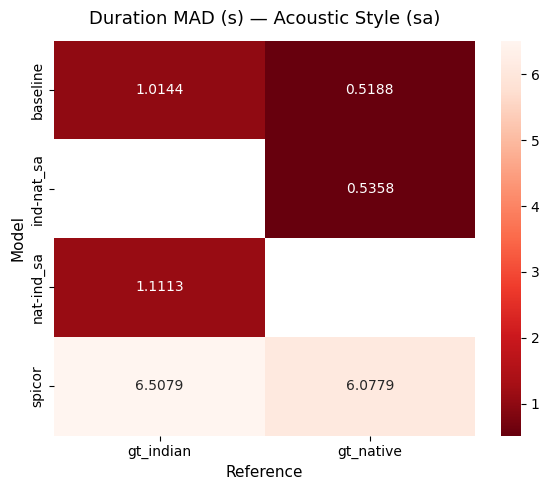


Duration MAD (s) [Acoustic Style (sa)]:


Reference,gt_indian,gt_native
Model,,
baseline,1.014446,0.518841
ind-nat_sa,NaN,0.535773
nat-ind_sa,1.111328,NaN
spicor,6.507941,6.077941


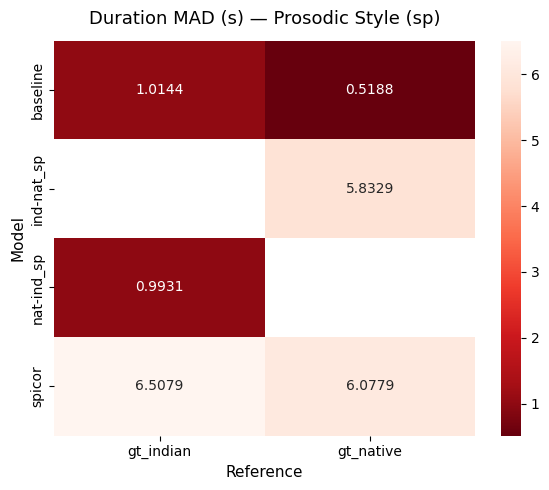


Duration MAD (s) [Prosodic Style (sp)]:


Reference,gt_indian,gt_native
Model,,
baseline,1.014446,0.518841
ind-nat_sp,NaN,5.832857
nat-ind_sp,0.993108,NaN
spicor,6.507941,6.077941



  4 / 6   Energy RMSE  (log-dB + DTW)
  [_s] baseline vs gt_native


  [_s] baseline vs gt_indian


  [_s] spicor vs gt_native


  [_s] spicor vs gt_indian


  [_s] nat-ind_s vs gt_indian


  [_s] ind-nat_s vs gt_native


  [_sa] baseline vs gt_native


  [_sa] baseline vs gt_indian


  [_sa] spicor vs gt_native


  [_sa] spicor vs gt_indian


  [_sa] nat-ind_sa vs gt_indian


  [_sa] ind-nat_sa vs gt_native


  [_sp] baseline vs gt_native


  [_sp] baseline vs gt_indian


  [_sp] spicor vs gt_native


  [_sp] spicor vs gt_indian


  [_sp] nat-ind_sp vs gt_indian


  [_sp] ind-nat_sp vs gt_native


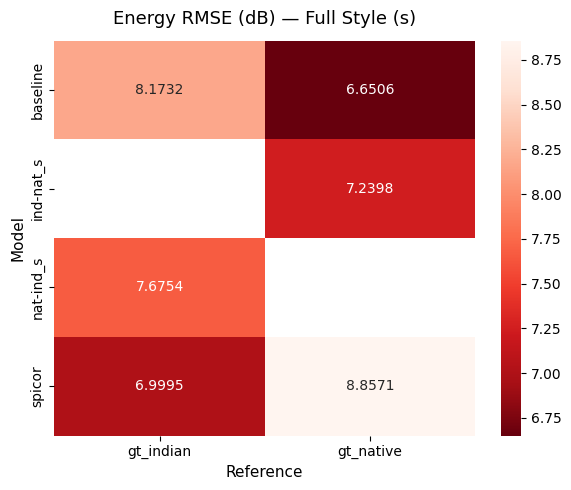


Energy RMSE (dB) [Full Style (s)]:


Reference,gt_indian,gt_native
Model,,
baseline,8.173177,6.650565
ind-nat_s,NaN,7.239812
nat-ind_s,7.675357,NaN
spicor,6.999483,8.857075


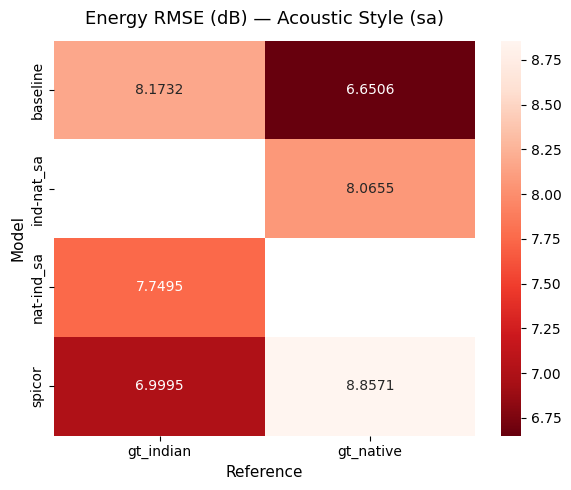


Energy RMSE (dB) [Acoustic Style (sa)]:


Reference,gt_indian,gt_native
Model,,
baseline,8.173177,6.650565
ind-nat_sa,NaN,8.065495
nat-ind_sa,7.749450,NaN
spicor,6.999483,8.857075


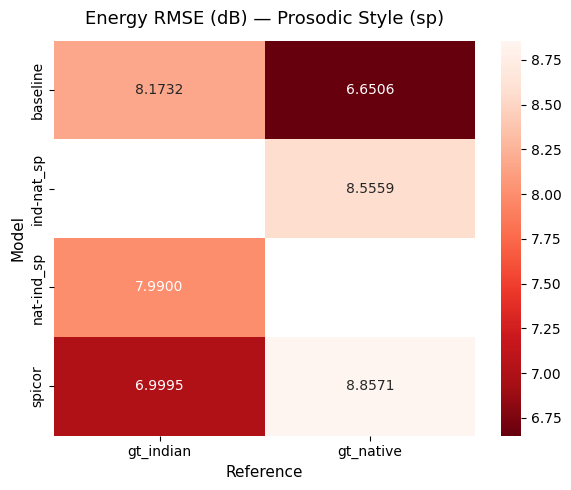


Energy RMSE (dB) [Prosodic Style (sp)]:


Reference,gt_indian,gt_native
Model,,
baseline,8.173177,6.650565
ind-nat_sp,NaN,8.555946
nat-ind_sp,7.989973,NaN
spicor,6.999483,8.857075



  6 / 6   Vowel Formant Distance  (Bark scale)
  [_s] baseline vs gt_native


  [_s] baseline vs gt_indian


  [_s] spicor vs gt_native


  [_s] spicor vs gt_indian


  [_s] nat-ind_s vs gt_indian


  [_s] ind-nat_s vs gt_native


  [_sa] baseline vs gt_native


  [_sa] baseline vs gt_indian


  [_sa] spicor vs gt_native


  [_sa] spicor vs gt_indian


  [_sa] nat-ind_sa vs gt_indian


  [_sa] ind-nat_sa vs gt_native


  [_sp] baseline vs gt_native


  [_sp] baseline vs gt_indian


  [_sp] spicor vs gt_native


  [_sp] spicor vs gt_indian


  [_sp] nat-ind_sp vs gt_indian


  [_sp] ind-nat_sp vs gt_native


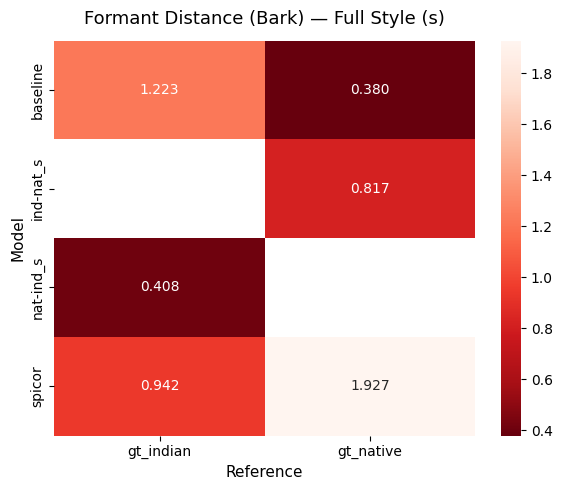


Formant Distance (Bark) [Full Style (s)]:


Reference,gt_indian,gt_native
Model,,
baseline,1.223489,0.379893
ind-nat_s,NaN,0.817355
nat-ind_s,0.408146,NaN
spicor,0.942322,1.927460


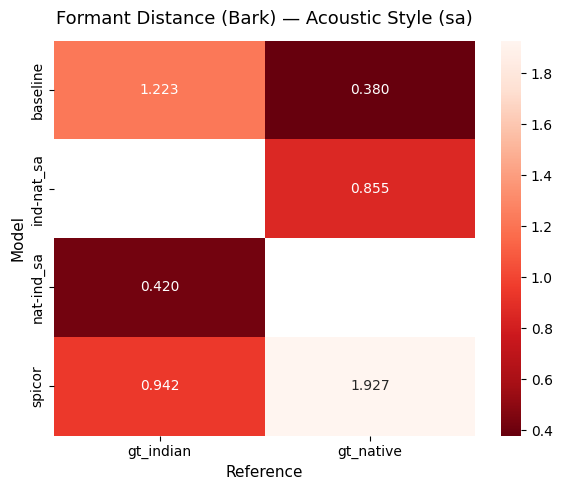


Formant Distance (Bark) [Acoustic Style (sa)]:


Reference,gt_indian,gt_native
Model,,
baseline,1.223489,0.379893
ind-nat_sa,NaN,0.854616
nat-ind_sa,0.420474,NaN
spicor,0.942322,1.927460


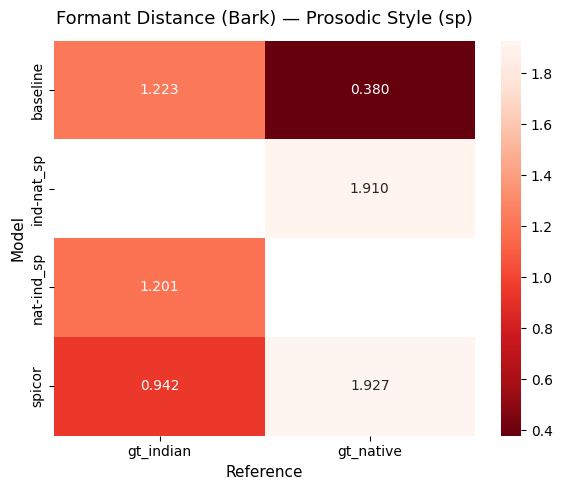


Formant Distance (Bark) [Prosodic Style (sp)]:


Reference,gt_indian,gt_native
Model,,
baseline,1.223489,0.379893
ind-nat_sp,NaN,1.909920
nat-ind_sp,1.201220,NaN
spicor,0.942322,1.927460



  7 / 7   PPG-DTW  (cache PPGs first)


100%|██████████| 238/238 [00:10<00:00, 21.92it/s]


PPG caching complete.
  [_s] PPG-DTW: baseline vs gt_native
  [_s] PPG-DTW: baseline vs gt_indian
  [_s] PPG-DTW: spicor vs gt_native
  [_s] PPG-DTW: spicor vs gt_indian
  [_s] PPG-DTW: nat-ind_s vs gt_indian
  [_s] PPG-DTW: ind-nat_s vs gt_native
  [_sa] PPG-DTW: baseline vs gt_native
  [_sa] PPG-DTW: baseline vs gt_indian
  [_sa] PPG-DTW: spicor vs gt_native
  [_sa] PPG-DTW: spicor vs gt_indian
  [_sa] PPG-DTW: nat-ind_sa vs gt_indian
  [_sa] PPG-DTW: ind-nat_sa vs gt_native
  [_sp] PPG-DTW: baseline vs gt_native
  [_sp] PPG-DTW: baseline vs gt_indian
  [_sp] PPG-DTW: spicor vs gt_native
  [_sp] PPG-DTW: spicor vs gt_indian
  [_sp] PPG-DTW: nat-ind_sp vs gt_indian
  [_sp] PPG-DTW: ind-nat_sp vs gt_native


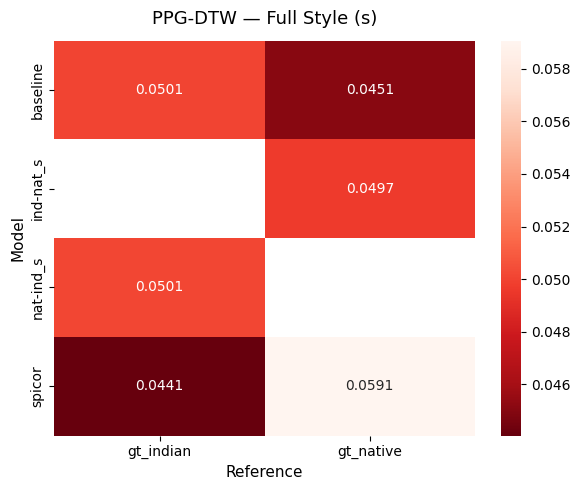


PPG-DTW [Full Style (s)]:


Reference,gt_indian,gt_native
Model,,
baseline,0.050091,0.045094
ind-nat_s,NaN,0.049660
nat-ind_s,0.050132,NaN
spicor,0.044058,0.059066


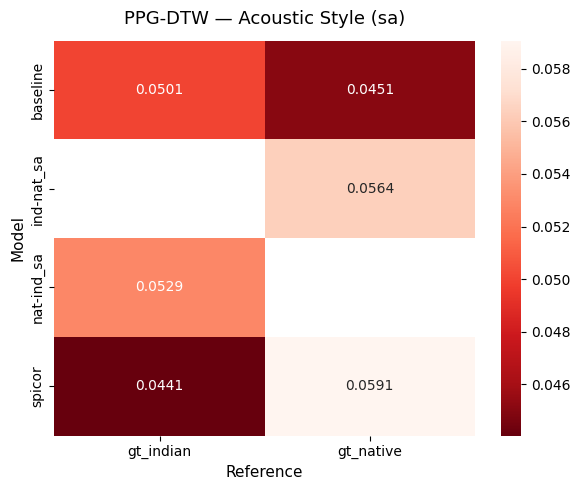


PPG-DTW [Acoustic Style (sa)]:


Reference,gt_indian,gt_native
Model,,
baseline,0.050091,0.045094
ind-nat_sa,NaN,0.056354
nat-ind_sa,0.052923,NaN
spicor,0.044058,0.059066


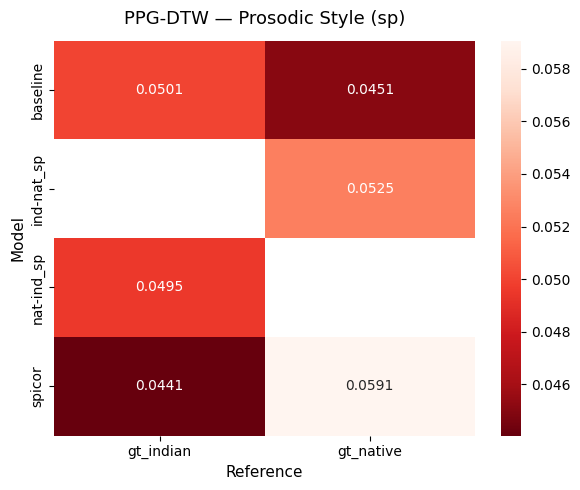


PPG-DTW [Prosodic Style (sp)]:


Reference,gt_indian,gt_native
Model,,
baseline,0.050091,0.045094
ind-nat_sp,NaN,0.052511
nat-ind_sp,0.049524,NaN
spicor,0.044058,0.059066


In [ ]:
# =====================================================
# MAIN — run all metrics
# =====================================================

if __name__ == "__main__":

    print("\n" + "=" * 60)
    print("  1 / 6   MCD")
    print("=" * 60)
    mcd_tables = compute_metric_tables(mcd_score, "MCD")
    plot_metric_heatmaps(mcd_tables, "MCD", fmt=".3f")

    print("\n" + "=" * 60)
    print("  2 / 6   Log F0 RMSE  (voiced + DTW)")
    print("=" * 60)
    logf0_tables = compute_metric_tables(logf0_rmse_score, "LogF0_RMSE")
    plot_metric_heatmaps(logf0_tables, "Log F0 RMSE", fmt=".4f")

    print("\n" + "=" * 60)
    print("  3 / 6   Duration MAD  (VAD segment durations)")
    print("=" * 60)
    dur_tables = compute_metric_tables(duration_mad_score, "Dur_MAD")
    plot_metric_heatmaps(dur_tables, "Duration MAD (s)", fmt=".4f")

    print("\n" + "=" * 60)
    print("  4 / 6   Energy RMSE  (log-dB + DTW)")
    print("=" * 60)
    energy_tables = compute_metric_tables(energy_rmse_score, "Energy_RMSE")
    plot_metric_heatmaps(energy_tables, "Energy RMSE (dB)", fmt=".4f")

    print("\n" + "=" * 60)
    print("  6 / 6   Vowel Formant Distance  (Bark scale)")
    print("=" * 60)
    form_tables = compute_metric_tables(formant_distance_score, "Formant_Dist")
    plot_metric_heatmaps(form_tables, "Formant Distance (Bark)", fmt=".3f")

    print("\n" + "=" * 60)
    print("  7 / 7   PPG-DTW  (cache PPGs first)")
    print("=" * 60)
    if PPG_AVAILABLE:
        cache_ppgs(master_dict)
    ppg_tables = compute_ppg_tables()
    plot_metric_heatmaps(ppg_tables, "PPG-DTW", fmt=".4f")